In [1]:
from agrid.grid import Grid
from pathlib import Path
import os, sys, pickle

from pathlib import Path

import pandas as pd

import re
import copy

import numpy as np
from numpy import asarray
from numpy import save
from numpy import load

from scipy import stats, interpolate, spatial, io
from scipy.ndimage import gaussian_filter, median_filter
import xarray as xr
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors
import matplotlib as mpl
from matplotlib.patches import Arc 
import cartopy.crs as ccrs

import pyproj as proj
import rasterio


from sklearn import linear_model
from sklearn.metrics import r2_score, mean_squared_error

import seaborn as sns

from joblib import Parallel, delayed
import multiprocessing
import numba as nb
from numba import jit

import warnings
warnings.filterwarnings('ignore')

# helper function for plotting
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.utils import shuffle

from sklearn.feature_selection import RFECV,RFE
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer, r2_score, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score, max_error, \
median_absolute_error, mean_absolute_percentage_error, mean_poisson_deviance, mean_gamma_deviance

from sklearn.feature_selection import RFECV,RFE
from sklearn.preprocessing import StandardScaler 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor

from sklearn.feature_selection import RFECV,RFE
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer , r2_score, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score, max_error, \
median_absolute_error, mean_absolute_percentage_error, mean_poisson_deviance, mean_gamma_deviance

from sklearn.feature_selection import RFECV,RFE
from sklearn.preprocessing import StandardScaler 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score, max_error, \
median_absolute_error, mean_absolute_percentage_error, mean_poisson_deviance, mean_gamma_deviance

import seaborn as sns

from sklearn.feature_selection import RFECV,RFE
from sklearn.preprocessing import StandardScaler 
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

import gstools as gst
from pykrige.rk import RegressionKriging
import operator


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score, max_error, \
median_absolute_error, mean_absolute_percentage_error, mean_poisson_deviance, mean_gamma_deviance

import seaborn as sns

from sklearn.preprocessing import PowerTransformer
from sklearn.compose import TransformedTargetRegressor

import pygmt



from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder , PowerTransformer

from sklearn.compose import TransformedTargetRegressor ,  ColumnTransformer


from sklearn.compose import make_column_selector as selector

from sklearn.model_selection import cross_val_score

In [2]:
# constanst

#parent directory

dir_p = Path().resolve() 

#constants
km = 1000
milli = 0.001
micro = 0.000001

src_crs=4326

# We can exclude Arctic ocean and Antarctica, as there are no HF measurements to use
world_lon_min, world_lon_max, world_lat_min, world_lat_max  = -180, 180, -60, 80

# map extents of Africa and Australia
afr_lon_min, afr_lon_max, afr_lat_min, afr_lat_max =  -20, 52, -37 , 38  


# create grid for each region
# crs Coordinate reference system

#EPSG is projection
# 0.2 degrees equal roughly 20 km

World = Grid(res=[0.2, 0.2], up=world_lat_max, down=world_lat_min)


# africa grid low resolution 50 x 50 km

Africa =    Grid(res=[0.5, 0.5],  left = afr_lon_min, right= afr_lon_max, up=afr_lat_max , down=afr_lat_min)


#dictionary of all grids

grids = {}

grids['Afr'] = Africa
grids['World'] = World


In [3]:

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [4]:
def concordance_correlation_coefficient(y_true, y_pred):
    """Concordance correlation coefficient."""
    # Remove NaNs
    df = pd.DataFrame({
        'y_true': y_true,
        'y_pred': y_pred
    })
    df = df.dropna()
    y_true = df['y_true']
    y_pred = df['y_pred']
    # Pearson product-moment correlation coefficients
    cor = np.corrcoef(y_true, y_pred)[0][1]
    # Mean
    mean_true = np.mean(y_true)
    mean_pred = np.mean(y_pred)
    # Variance
    var_true = np.var(y_true)
    var_pred = np.var(y_pred)
    # Standard deviation
    sd_true = np.std(y_true)
    sd_pred = np.std(y_pred)
    # Calculate CCC
    numerator = 2 * cor * sd_true * sd_pred
    denominator = var_true + var_pred + (mean_true - mean_pred)**2
    return numerator / denominator

In [5]:
# to ease looping with dictionaries

regions_a = [ 'Afr' ]


regions_Total = ['World' ,'Afr']


# raster exenets to adjust map
raster_extent_Afr = [grids['Afr'].extent[0], grids['Afr'].extent[1], grids['Afr'].extent[3], grids['Afr'].extent[2]]
raster_extent_World = [grids['World'].extent[0], grids['World'].extent[1], grids['World'].extent[3], grids['World'].extent[2]]

# to correct plot maps
raster_extents = {}

raster_extents['Afr'] = raster_extent_Afr
raster_extents['World'] = raster_extent_World


# list of latitudes and longitudes
lon_dict = {}
lat_dict = {}

lon_dict['Afr'] = [afr_lon_min, afr_lon_max]
lon_dict['World'] = [world_lon_min, world_lon_max]

lat_dict['Afr'] = [afr_lat_min, afr_lat_max]
lat_dict['World'] = [world_lat_min, world_lat_max]



print('terminated')

terminated


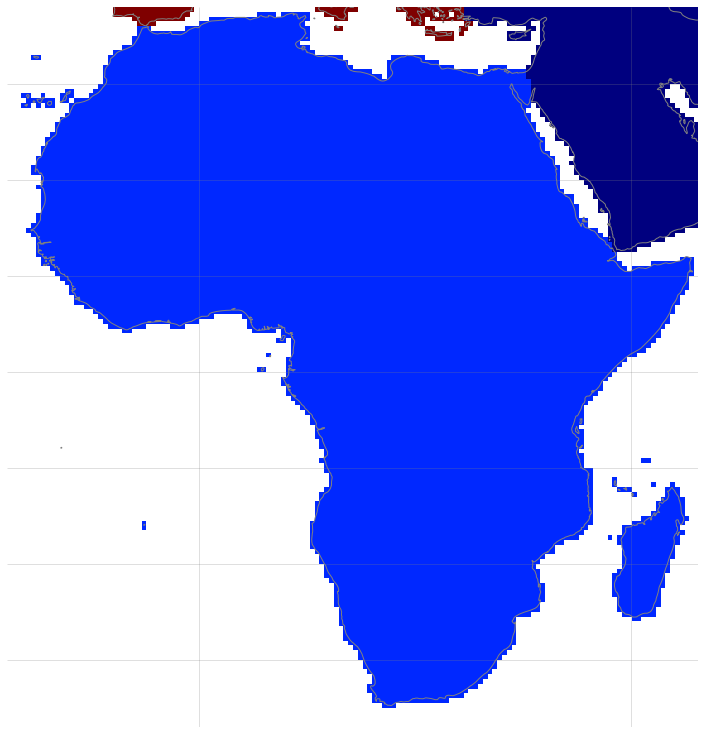

In [6]:
#https://github.com/nvkelso/natural-earth-vector
# natural earth 10 m land shape
ne_10m_land = dir_p / 'data'/ 'Shapefiles'/'NE'/ 'ne_10m_land.shp'
continents = dir_p /'data'/ 'Shapefiles'/'continents'/ 'continent.shp'

# LAND is water vs land
#Continet describes each continent

#assign_shape Rasterize vector polygons to grid 

region = 'Afr'
# Use continental plates instead
grids[region].ds['LAND'] = (('Y', 'X'), grids[region].assign_shape(ne_10m_land, 
                                           'scalerank', map_to_int = False, burn_val = 1))


grids[region].ds['CONTINENT'] = (('Y', 'X'), grids[region].assign_shape(continents, 
                                           'CONTINENT', map_to_int = True))



grids[region].map_grid('CONTINENT', raster_extent= raster_extents[region], 
                      cmap='jet', figsize=(10,10))




In [7]:
obs = pd.DataFrame()



obs["OBS_REF"] = ["CTD" ,  "SI","LAB", "MOHO",
            "SV","PV", 
            "GEOID","FA","DEM","BG", "EMAG2_CLASS",
                   "RHO_L", "RHO_C", 
                  "VOLC_DIST_W", "REG", "GLIM"]

obs["OBS_AFR"] = ["CTD" ,  "SI","LAB", "MOHO",
            "SV_SPEED","PV_SPEED", 
            "GEOID","FA","DEM","BG", "EMAG2",
                   "RHO_L", "RHO_C", 
                  "VOLC_DIST", "REG", "GLIM"]
  
     
# Labels for plots etc


# Labels for plots etc
obs["LABELS"] = ["CTD",  "Shape index", "LAB", "Moho", 
                "S@_v@ 150km", "P@_v@ 150km", 
                "Geoid", "Free air", "DEM", "Bouguer", "Mag.", 
                "Lith. rho", "Crust rho",  
                 "Volcano", "REG", "GliM", ]  


obs["LABELS_gmt"] = ["CTD",  "Shape index", "LAB", "Moho", 
                "$S_v$ @150km", "$P_v$ @150km", 
                "Geoid", "Free air", "DEM", "Bouguer", "Mag.", 
                "Lith. ρ", "Crust ρ",  
                 "Volcano", "REG", "GliM", ]
    
# "vp/vs"
# Units to display in plots etc
obs["UNITS"] = ["km",  "si", "km", "km",
             "$\delta$ v_s %","$\delta$ v_p %", 
             "m", "mGal", "m", "mGal",  "f(nT)", 
                 "kg/m$^3$", "kg/m$^3$",
                "km",  "class", "class"]



obs["UNITS_gmt"] = ["km",  "si", "km", "km",
             "km/s","km/s", 
             "m", "mGal", "m", "mGal",  "nT", 
                 "kg/m@+3@+", "kg/m@+3@+",
                "km",  "class", "class"]
        
# Range of colormap for plots. Similar data are placed in same ranges for consistancy
obs["V_RANGE"] = [(0,50), (-1,1),(0,300),(15,60),
              (-0.075,0.075), (-0.02,0.02), 
              (-45,45), (-100,100) , (-2200, 2200),(-100,100),  (-0.4, 0.4), 
                   (3260, 3360), (2650, 2950),
                  (0,1), (1,6),(1,16),]


    
obs["V_RANGE_AFR"] = [(0,50), (-1,1),(50,250),(20,50),
          (-0.075,0.075), (-0.02,0.02), 
          (-45,45), (-100,100) , (-2200, 2200),(-100,100),  (-200, 200), 
               (3260, 3360), (2650, 2950),
              (0,100), (1,6),(1,15),]


obs["CMAPS"] = ["batlow",  "broc", "bamako", "batlow", 
             "roma","roma", 
             "bamako", "broc", "bukavu", "broc", "batlow",            
                "batlow", "batlow",
               "bamako",  "batlowS","topo", ]


#new_index = [4,3,15,6,7,0,14,10,16,17,9, 2,1,5,13,12, 8,11,]

#new_index = [4,3,15,6,7,0, 14, 10,16, 8, 9,2, 13, 12, 8, 11, ]

#obs = obs.reindex(new_index)

obs.index = np.arange(0,len(obs))

pd.options.display.width = 370
pd.options.display.max_colwidth = 12
print(obs)

n_obs = len(obs)

obs_dict = obs.to_dict(orient="records")



        OBS_REF    OBS_AFR       LABELS   LABELS_gmt        UNITS  UNITS_gmt      V_RANGE  V_RANGE_AFR    CMAPS
0           CTD        CTD          CTD          CTD           km         km      (0, 50)      (0, 50)   batlow
1            SI         SI  Shape index  Shape index           si         si      (-1, 1)      (-1, 1)     broc
2           LAB        LAB          LAB          LAB           km         km     (0, 300)    (50, 250)   bamako
3          MOHO       MOHO         Moho         Moho           km         km     (15, 60)     (20, 50)   batlow
4            SV   SV_SPEED  S@_v@ 150km  $S_v$ @1...  $\delta$...       km/s  (-0.075,...  (-0.075,...     roma
5            PV   PV_SPEED  P@_v@ 150km  $P_v$ @1...  $\delta$...       km/s  (-0.02, ...  (-0.02, ...     roma
6         GEOID      GEOID        Geoid        Geoid            m          m    (-45, 45)    (-45, 45)   bamako
7            FA         FA     Free air     Free air         mGal       mGal  (-100, 100)  (-100, 100)  

In [8]:

target = 'heat-flow (mW/m2)'
coord = ['lon', 'lat']
grid_index = ['grid_index']


#######

features_ex = []
features_ghf = []



features = obs['OBS_REF'].tolist()



in_features = set(features)

features_ex = copy.deepcopy(features)
features_ex.extend(coord)
features_ex.extend(grid_index)

features_ex.append(target)

features_ghf = copy.deepcopy(features)
features_ghf.append(target)




In [9]:

training_Afr_ra_f =  dir_p/'data'/'dataset'/'Preprocessed'/'Training_Afr_OD_ra.csv'
training_Afr_ra = pd.read_csv(training_Afr_ra_f, sep='\t')

training_Afr_rab_f =  dir_p/'data'/'dataset'/'Preprocessed'/'Training_Afr_OD_rab.csv'
training_Afr_rab = pd.read_csv(training_Afr_rab_f, sep='\t')

#######

training_Afr_int_ra_f =  dir_p/'data'/'dataset'/'Preprocessed'/'Training_Afr_ra_int.csv'
training_Afr_int_ra = pd.read_csv(training_Afr_int_ra_f)

training_Afr_int_rab_f =  dir_p/'data'/'dataset'/'Preprocessed'/'Training_Afr_rab_int.csv'
training_Afr_int_rab = pd.read_csv(training_Afr_int_rab_f)


mask_ra = training_Afr_int_ra[target] <200

training_Afr_int_ra  = training_Afr_int_ra[mask_ra]


mask_rab = training_Afr_int_rab[target] <200

training_Afr_int_rab  = training_Afr_int_rab[mask_rab]
######


training_Afr_int_ra



training_Afr_rab

,index,CTD,SI,LAB,MOHO,SV,PV,GEOID,FA,DEM,...,EMAG2_CLASS,RHO_L,RHO_C,VOLC_DIST_W,REG,GLIM,lon,lat,grid_index,heat-flow (mW/m2)
0,0,22.507461,0.933484,112.976530,25.708034,0.010021,-0.007703,28.777662,16.009990,28.0,...,0.060112,3335.865830,2791.351466,0.877958,6,3,-17.450,14.750,14837,66.8
1,1,22.507461,0.933484,112.976530,25.708034,0.010021,-0.007703,28.777662,16.009990,28.0,...,0.060112,3335.865830,2791.351466,0.877958,6,3,-17.433,14.683,14837,81.0
2,2,22.507461,0.933484,112.976530,25.708034,0.010021,-0.007703,28.777662,16.009990,28.0,...,0.060112,3335.865830,2791.351466,0.877958,6,3,-17.433,14.717,14837,73.2
3,3,22.507461,0.933484,112.976530,25.708034,0.010021,-0.007703,28.777662,16.009990,28.0,...,0.060112,3335.865830,2791.351466,0.877958,6,3,-17.433,14.733,14837,78.5
4,4,22.507461,0.933484,112.976530,25.708034,0.010021,-0.007703,28.777662,16.009990,28.0,...,0.060112,3335.865830,2791.351466,0.877958,6,3,-17.417,14.700,14837,67.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1751,1761,19.348889,0.766193,69.261390,29.088212,0.003610,-0.010940,-28.031926,52.847828,1177.0,...,-0.003435,3285.211875,2780.624135,0.000000,2,6,49.750,10.667,13819,59.0
1752,1762,21.403241,-0.320319,82.167650,26.317240,0.033617,-0.010427,-37.404268,10.330066,287.0,...,0.029141,3304.783153,2816.476783,0.000000,2,6,50.517,9.550,13388,59.0
1753,1763,21.403241,-0.320319,82.167650,26.317240,0.033617,-0.010427,-37.404268,10.330066,287.0,...,0.029141,3304.783153,2816.476783,0.000000,2,6,50.667,9.417,13388,59.0
1754,1764,20.786140,-0.155005,72.119747,24.509425,0.021729,-0.010764,-33.291200,7.114842,242.0,...,0.016540,3282.138780,2780.455822,0.000000,2,1,51.000,10.617,13821,54.0


# Tree visiualization

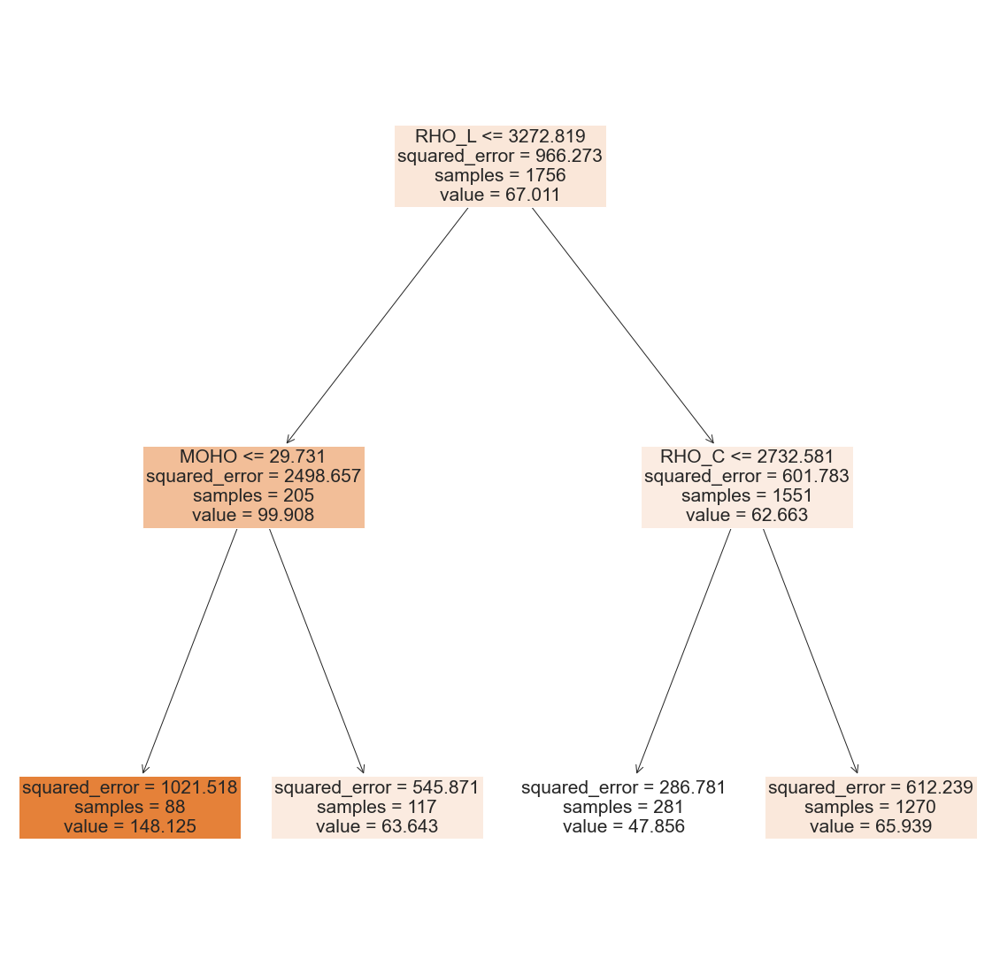

In [10]:
from sklearn import tree


label = 'AFR' 


x_Afr = copy.deepcopy(training_Afr_rab[coord])

y_Afr = training_Afr_rab[target]
p_Afr = training_Afr_rab[features]




#####visulaize

regressor_rk = RandomForestRegressor()

best_params = {'bootstrap': False,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 2,
 'max_features': 'log2',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 3,
 'min_samples_split': 6,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 450,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


regressor_rk.set_params(**best_params)


regressor_rk.fit(p_Afr,y_Afr)

regressor_rk.get_params()

rf = regressor_rk

fn= ['CTD',
 'SI',
 'LAB',
 'MOHO',
 'SV',
 'PV',
 'GEOID',
 'FA',
 'DEM',
 'BG',
 'EMAG2',
 'RHO_L',
 'RHO_C',
 'VOLC_D',
 'REG',
 'GLIM']

cn=target
fig, axes = plt.subplots(figsize = (20,20) )


tree.plot_tree(rf.estimators_[100],
               feature_names = fn, 
               class_names=cn,
               fontsize=21,
               filled = True);


#fig.savefig(dir_p/ 'fig'/'presentation'/"fig_3.JPEG", bbox_inches='tight', dpi=300 )

# Visualiazation

# AFR

In [11]:
region ='Afr'

# Initialize auc_score dictionary

# Set figure size and create 
# ra with training ra

files_ra = [filename \
         for filename in os.listdir(dir_p/'Grids'/'outputs') 
         if 'rab' not in filename and 'RFE' in filename]


labels_ra = [filename.replace('.nc', '') for filename in files_ra]

for label, file in zip(labels_ra, files_ra):
    path_grd_ra = dir_p/'Grids'/'outputs'/f'{file}'


    grids[region].ds[f'{label}']  = (('Y', 'X'), grids[region].read_raster(
        path_grd_ra ,  src_crs=src_crs))
    
    
files_rab = [filename \
         for filename in os.listdir(dir_p/'Grids'/'outputs') 
         if 'rab' in filename and 'RFE' in filename]


labels_rab = [filename.replace('.nc', '') for filename in files_rab]

for label, file in zip(labels_rab, files_rab):
    path_grd_rab = dir_p/'Grids'/'outputs'/f'{file}'


    grids[region].ds[f'{label}']  = (('Y', 'X'), grids[region].read_raster(
        path_grd_rab ,  src_crs=src_crs))
    
grids[region].ds

<xarray.Dataset>
Dimensions:     (X: 144, Y: 150, Z: 5, X_edge: 145, Y_edge: 151, Z_edge: 6, RGB: 3)
Coordinates:
  * X           (X) float32 -20.0 -19.5 -18.99 -18.49 ... 50.49 50.99 51.5 52.0
  * Y           (Y) float32 -37.0 -36.5 -35.99 -35.49 ... 36.49 36.99 37.5 38.0
  * Z           (Z) float32 0.0 8e+03 1.6e+04 4e+04 3.5e+05
  * X_edge      (X_edge) float32 -20.25 -19.75 -19.24 ... 51.24 51.75 52.25
  * Y_edge      (Y_edge) float32 -37.25 -36.75 -36.24 ... 37.24 37.75 38.25
  * Z_edge      (Z_edge) float64 -4e+03 4e+03 1.2e+04 2.8e+04 1.95e+05 5.05e+05
  * RGB         (RGB) <U1 'R' 'G' 'B'
    XV          (Y, X) float32 -20.0 -19.5 -18.99 -18.49 ... 50.99 51.5 52.0
    YV          (Y, X) float32 -37.0 -37.0 -37.0 -37.0 ... 38.0 38.0 38.0 38.0
    lat         (Y, X) float32 -37.0 -37.0 -37.0 -37.0 ... 38.0 38.0 38.0 38.0
    lon         (Y, X) float32 -20.0 -19.5 -18.99 -18.49 ... 50.99 51.5 52.0
Data variables: (12/28)
    LAND        (Y, X) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    CONTINENT   (Y, X) float64 nan nan nan nan nan nan ... 1.0 1.0 1.0 1.0 1.0
    RFE_04_ra   (Y, X) float64 80.43 108.2 104.6 99.29 ... 55.73 55.68 57.48
    RFE_05_ra   (Y, X) float64 86.06 103.5 100.1 93.97 ... 50.47 49.21 49.53
    RFE_06_ra   (Y, X) float64 73.38 90.55 83.72 78.71 ... 54.68 53.98 54.22
    RFE_07_ra   (Y, X) float64 57.92 70.19 64.24 61.67 ... 59.52 58.83 59.14
    ...          ...
    RFE_11_rab  (Y, X) float64 54.53 55.77 56.45 56.88 ... 55.57 56.58 57.19
    RFE_12_rab  (Y, X) float64 54.68 56.47 56.35 57.72 ... 56.89 57.33 57.93
    RFE_13_rab  (Y, X) float64 54.7 56.32 55.99 56.0 ... 57.96 57.8 57.77 57.84
    RFE_14_rab  (Y, X) float64 54.39 55.72 55.92 57.22 ... 57.23 57.51 57.85
    RFE_15_rab  (Y, X) float64 55.5 56.6 56.74 56.77 ... 59.52 58.42 59.01 59.4
    RFE_16_rab  (Y, X) float64 52.47 53.62 53.59 53.0 ... 56.4 55.15 55.59 56.13

In [12]:
region = 'Afr'
predictions_max_min_rab = pd.DataFrame()

for label in labels_rab:

    predictions_max_min_rab[f'{label}']  = pd.DataFrame(grids[region].ds[f'{label}'].T.values.reshape(-1,1))
    predictions_max_min_rab['max'] = predictions_max_min_rab.max(1)
    predictions_max_min_rab['min'] = predictions_max_min_rab.min(1)
    
predictions_max_min_ra = pd.DataFrame()

for label in labels_ra:

    predictions_max_min_ra[f'{label}']  = pd.DataFrame(grids[region].ds[f'{label}'].T.values.reshape(-1,1))
    predictions_max_min_ra['max'] = predictions_max_min_ra.max(1)
    predictions_max_min_ra['min'] = predictions_max_min_ra.min(1)
    
predictions_max_min_ra
    
#predictions_max_min_rab

,RFE_04_ra,max,min,RFE_05_ra,RFE_06_ra,RFE_07_ra,RFE_08_ra,RFE_09_ra,RFE_10_ra,RFE_11_ra,RFE_12_ra,RFE_13_ra,RFE_14_ra,RFE_15_ra,RFE_16_ra
0,80.433802,86.064885,57.598346,86.064885,73.381584,57.920649,57.736733,61.349517,59.673847,58.587432,58.054976,62.198295,57.598346,61.944083,61.332839
1,80.253764,85.947177,58.305402,85.947177,74.873392,58.388884,58.489019,62.477767,60.956737,59.174072,59.030182,62.993821,58.305402,62.551048,62.143101
2,79.192902,83.853544,60.610188,83.853544,74.987427,62.367137,60.917072,62.939072,63.062504,61.800400,61.043299,65.863049,60.610188,65.098232,64.981143
3,51.111656,57.927943,41.427290,57.927943,55.364727,45.017969,44.631653,41.427290,43.465714,42.110139,45.072745,47.218768,46.205978,50.100854,46.705932
4,50.378815,61.835822,42.018260,57.941546,61.835822,46.866423,45.183795,42.018260,43.628068,42.861611,46.206101,46.932838,45.884722,50.690469,47.291958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21595,47.330646,60.079693,47.330646,52.008442,47.644285,52.866210,56.791898,58.412088,57.669114,58.011989,57.927260,60.071779,58.417030,59.995001,60.079693
21596,47.386525,59.123508,47.386525,50.212197,51.054403,52.637015,56.359699,56.787633,55.951385,57.882535,57.238437,58.586376,56.693570,58.555063,59.123508
21597,51.831920,68.230367,51.831920,52.712145,61.782351,60.920425,65.601159,68.230367,63.553482,63.978340,62.831279,60.936858,62.242071,61.702698,62.077604
21598,55.945753,68.735153,52.737824,52.737824,57.846685,62.618378,66.473399,68.735153,62.538446,65.484165,63.818520,62.194907,64.133402,63.471992,64.430606


In [13]:
region = 'Afr'




sub_figs = list('ABCDEFGHIJKLMNOPQRSTUVWXYZ')


file_rfe = '11'


label_ra = [ label for label in labels_ra if file_rfe in label]
label_rab = [ label for label in labels_rab if file_rfe in label]

Afr_Q_rab = pd.DataFrame(grids[region].ds[f'{label_rab[0]}'].T.values.reshape(-1,1))
Afr_Q_ra = pd.DataFrame(grids[region].ds[f'{label_ra[0]}'].T.values.reshape(-1,1))


print(f'max ra {Afr_Q_ra.max()[0]} min {Afr_Q_ra.min()[0]}')
print(f'max rab {Afr_Q_rab.max()[0]} min {Afr_Q_rab.min()[0]}')

lon = pd.DataFrame(grids[region].lon.T.reshape(-1,1))
lat = pd.DataFrame(grids[region].lat.T.reshape(-1,1))


df_Afr_rab = pd.concat([lon, lat, Afr_Q_rab,
                             (predictions_max_min_rab['max'] - predictions_max_min_rab['min'])/2,
                          ] , axis=1).dropna()

df_Afr_rab.columns = ['lon', 'lat', 'Q_RF' ,'UNC',]



df_Afr_ra = pd.concat([lon, lat,  Afr_Q_ra,
                         (predictions_max_min_ra['max'] - predictions_max_min_ra['min'])/2,
                          ] , axis=1).dropna()

df_Afr_ra.columns = ['lon', 'lat', 'Q_RF', 'UNC',]


Afr_Q_rab = df_Afr_rab[['lon', 'lat','Q_RF']]
data_rab = Afr_Q_rab.values

Afr_Q_ra = df_Afr_ra[['lon', 'lat','Q_RF']]
data_ra = Afr_Q_ra.values

Afr_UNC_rab = df_Afr_rab[['lon', 'lat','UNC']]
data_UNC_rab = Afr_UNC_rab.values

Afr_UNC_ra = df_Afr_ra[['lon', 'lat','UNC']]
data_UNC_ra = Afr_UNC_ra.values


mu_rab = df_Afr_rab['Q_RF'].mean()
mu_ra = df_Afr_ra['Q_RF'].mean()

df_Afr_RSD_rab = df_Afr_rab[['lon', 'lat']]
df_Afr_RSD_rab['Q_RSD'] = (np.sqrt((df_Afr_rab['Q_RF'] - mu_rab)**2)/ mu_rab)  *100
data_RSD_rab =  df_Afr_RSD_rab.values 

df_Afr_RSD_ra = df_Afr_ra[['lon', 'lat']]
df_Afr_RSD_ra['Q_RSD'] = (np.sqrt((df_Afr_ra['Q_RF'] - mu_ra)**2)/ mu_ra) *100
data_RSD_ra =  df_Afr_RSD_ra.values 


# ra
prediction_df_ra = pd.DataFrame()

prediction_df_ra['y'] = training_Afr_ra[target]
prediction_df_ra['lat'] = training_Afr_ra['lat']
prediction_df_ra['lon'] =  training_Afr_ra['lon']
prediction_df_ra['y_hat'] = grids[region].ds[f'{label_ra[0]}'].values.ravel()[training_Afr_ra['grid_index']]
prediction_df_ra['y_hat'] = grids[region].ds[f'{label_ra[0]}'].values.ravel()[training_Afr_ra['grid_index']]


prediction_df_ra.dropna(inplace=True)

gt_Afr_ra_lat = prediction_df_ra['lat'].values
gt_Afr_ra_lon =  prediction_df_ra['lon'].values
y_test_ra = prediction_df_ra['y'].values
y_pred_ra = prediction_df_ra['y_hat'].values
y_pred_ra = prediction_df_ra['y_hat'].values


#rab
prediction_df_rab = pd.DataFrame()

prediction_df_rab['y'] = training_Afr_rab[target]
prediction_df_rab['lat'] = training_Afr_rab['lat']
prediction_df_rab['lon'] =  training_Afr_rab['lon']
prediction_df_rab['y_hat'] = grids[region].ds[f'{label_rab[0]}'].values.ravel()[training_Afr_rab['grid_index']]
prediction_df_rab['y_hat'] = grids[region].ds[f'{label_rab[0]}'].values.ravel()[training_Afr_rab['grid_index']]


prediction_df_rab.dropna(inplace=True)

gt_Afr_rab_lat = prediction_df_rab['lat'].values
gt_Afr_rab_lon =  prediction_df_rab['lon'].values
y_test_rab = prediction_df_rab['y'].values
y_pred_rab = prediction_df_rab['y_hat'].values
y_pred_rab = prediction_df_rab['y_hat'].values


#rb
prediction_df_rb = pd.concat([prediction_df_rab, prediction_df_ra])

prediction_df_rb.drop_duplicates(['y' , 'lat', 'lon'], keep=False, inplace = True)


gt_Afr_rb_lat = prediction_df_rb['lat'].values
gt_Afr_rb_lon =  prediction_df_rb['lon'].values
y_test_rb = prediction_df_rb['y'].values
y_pred_rb = prediction_df_rb['y_hat'].values
y_pred_rb = prediction_df_rb['y_hat'].values

resid_rb = (prediction_df_rb['y'] - prediction_df_rb['y_hat'] ).values

resid_rab = (prediction_df_rab['y'] - prediction_df_rab['y_hat'] ).values
 
resid_ra = (prediction_df_ra['y']  - prediction_df_ra['y_hat'] ).values


print(f' len of ra : {len(prediction_df_ra)}')
print(f' len of rb : {len(prediction_df_rb)}')
print(f' len of rab : {len(prediction_df_rab)}')

print(f" > 125 : {len(prediction_df_rab[prediction_df_rab['y'] > 125])/len(prediction_df_rab) * 100}")
print(f" <50 : {len(prediction_df_rab[prediction_df_rab['y'] < 50])/len(prediction_df_rab) * 100}")


#len(training_Afr_rab[target])



max ra 168.93759890372846 min 15.251661806662952
max rab 172.57966824966897 min 17.248337222957527
 len of ra : 871
 len of rb : 885
 len of rab : 1756
 > 125 : 5.466970387243736
 <50 : 28.416856492027335


69729
5792
22940
5792
6915
22940
1088
terminated


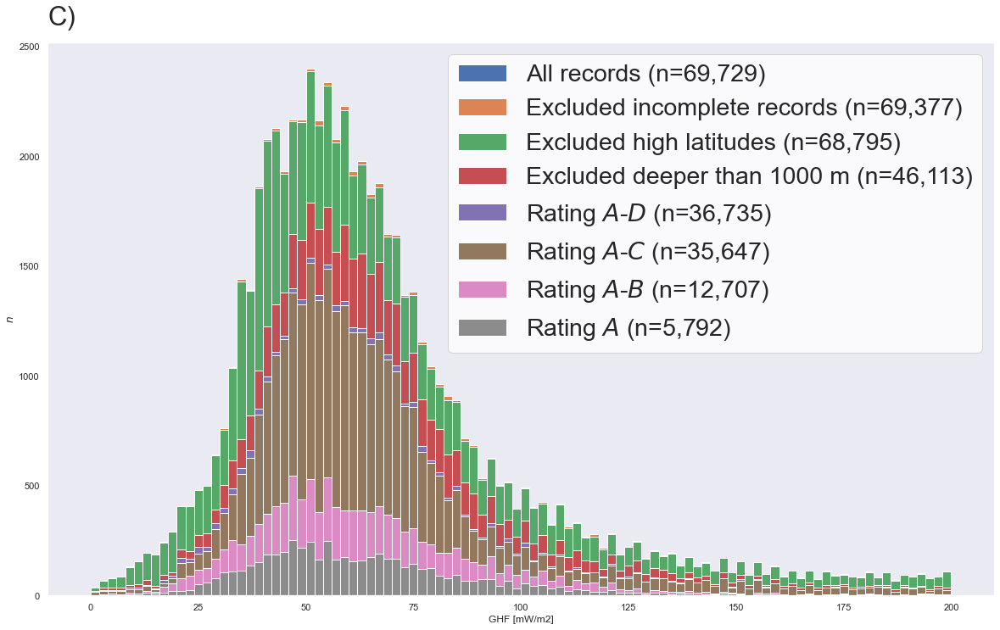

In [14]:

#create two datsets for A ratibng and b ratings
HGHF_file = dir_p / 'data' / 'dataset'/ 'Reference'/'q_Heat_flow'/'NGHF.csv'


hf = pd.read_csv(HGHF_file)
# change heat flow to mili

elev_cut = -1000



record_total = pd.read_csv(HGHF_file)

print(len(record_total))
hf_clean = record_total.dropna(subset = ['longitude', 'latitude', 'heat-flow (mW/m2)'])


hf_no_pole = hf_clean[hf_clean['latitude'].between(world_lat_min, world_lat_max, inclusive='both')]
hf_deep = hf_no_pole[(hf_no_pole['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]

hf_final_a = hf_no_pole[(hf_no_pole ['code6']=='A') & (hf_no_pole ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]
hf_final_b = hf_no_pole[(hf_no_pole ['code6']=='B') & (hf_no_pole ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]

hf_final_c = hf_no_pole[(hf_no_pole ['code6']=='C') & (hf_no_pole ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]
hf_final_d = hf_no_pole[(hf_no_pole ['code6']=='D') & (hf_no_pole ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]


######A rating

hf_final_a.columns = ['lon', 'lat', 'heat-flow (mW/m2)']


hf_final_a = hf_final_a.round(3)

print(len(hf_final_a))
hf_final_a.replace(' ', np.nan, inplace=True)
hf_final_a.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_final_a.reset_index( inplace=True,drop=True)

assert hf_final_a['lon'].max() <= 180, f" max lon {hf_final_a['lon'].max()}"
assert hf_final_a['lon'].min() >= -180, f" min lon {hf_final_a['lon'].min()}"
assert hf_final_a['lat'].max() <= 90, f" max lat {hf_final_a['lat'].max()}"
assert hf_final_a['lat'].min() >= -90, f" min lat {hf_final_a['lon'].min()}"


###### A+ B rating

hf_final_b.columns = ['lon', 'lat', 'heat-flow (mW/m2)']


hf_final_b = hf_final_b.round(3)

hf_final_b.replace(' ', np.nan, inplace=True)
hf_final_b.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_final_b.reset_index( inplace=True,drop=True)


assert hf_final_b['lon'].max() <= 180, f" max lon {hf_final_b['lon'].max()}"
assert hf_final_b['lon'].min() >= -180, f" min lon {hf_final_b['lon'].min()}"
assert hf_final_b['lat'].max() <= 90, f" max lat {hf_final_b['lat'].max()}"
assert hf_final_b['lat'].min() >= -90, f" min lat {hf_final_b['lon'].min()}"



###### A+ B + C rating

hf_final_c.columns = ['lon', 'lat', 'heat-flow (mW/m2)']


hf_final_c = hf_final_c.round(3)

hf_final_c.replace(' ', np.nan, inplace=True)
hf_final_c.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_final_c.reset_index( inplace=True,drop=True)
print(len(hf_final_c))

assert hf_final_c['lon'].max() <= 180, f" max lon {hf_final_c['lon'].max()}"
assert hf_final_c['lon'].min() >= -180, f" min lon {hf_final_c['lon'].min()}"
assert hf_final_c['lat'].max() <= 90, f" max lat {hf_final_c['lat'].max()}"
assert hf_final_c['lat'].min() >= -90, f" min lat {hf_final_c['lon'].min()}"


###### A+ B + C rating and elevation

hf_final_d.columns = ['lon', 'lat', 'heat-flow (mW/m2)']


hf_final_d = hf_final_d.round(3)

hf_final_d.replace(' ', np.nan, inplace=True)
hf_final_d.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_final_d.reset_index( inplace=True,drop=True)


assert hf_final_d['lon'].max() <= 180, f" max lon {hf_final_d['lon'].max()}"
assert hf_final_d['lon'].min() >= -180, f" min lon {hf_final_d['lon'].min()}"
assert hf_final_d['lat'].max() <= 90, f" max lat {hf_final_d['lat'].max()}"
assert hf_final_d['lat'].min() >= -90, f" min lat {hf_final_d['lon'].min()}"


print(len(hf_final_a))
print(len(hf_final_b))

print(len(hf_final_c))
print(len(hf_final_d))


print('terminated')

fig, ax = plt.subplots( figsize=(20, 12))
#print(plt.style.available)
#plt.style.use('_classic_test_patch')

sns.set(style='white', font_scale = 2.6)

record_total[target].hist(bins=100, range = (0, 200), ax=ax,
                          label = f'All records (n={len(record_total):,})')
                          
hf_clean[target].hist(bins=100, range = (0, 200), ax=ax,
                      label = f'Excluded incomplete records (n={len(hf_clean):,})')
hf_no_pole[target].hist(bins=100, range = (0, 200), ax=ax,
                         label = f'Excluded high latitudes (n={len(hf_no_pole):,})')
hf_deep[target].hist(bins=100, range = (0, 200), ax=ax,
                         label = f'Excluded deeper than {abs(elev_cut)} m (n={len(hf_deep):,})')

pd.concat([hf_final_a[target], hf_final_b[target], hf_final_c[target], 
           hf_final_d[target]]).hist(
    bins=100, range = (0, 200), ax=ax,
label = f'Rating $A$-$D$ (n={len(hf_final_a) + len(hf_final_b)+ len(hf_final_c) + len(hf_final_d):,})')
pd.concat([hf_final_a[target], hf_final_b[target], hf_final_c[target]]).hist(
    bins=100,  range = (0, 200),ax=ax,
label = f'Rating $A$-$C$ (n={len(hf_final_a) + len(hf_final_b) + len(hf_final_c):,})')
pd.concat([hf_final_a[target], hf_final_b[target]]).hist(
    bins=100,  range = (0, 200),ax=ax,
                        label = f'Rating $A$-$B$ (n={len(hf_final_a) + len(hf_final_b ):,})')
hf_final_a[target].hist(bins=100,  range = (0, 200),ax=ax,
                        label = f'Rating $A$ (n={len(hf_final_a):,})')


ax.set_title(f'{sub_figs[2]})', loc ='left', pad=20, )
ax.legend()
ax.set_ylabel(f'$n$')

ax.set_xlabel('GHF [mW/m2]')
ax.grid(False)

#ax.set_title('Distribution of different global GHF values', pad=40,)


fig.savefig(dir_p/'fig'/"fig_s1b.jpeg", bbox_inches='tight', dpi=300 , pad_inches=0.2)

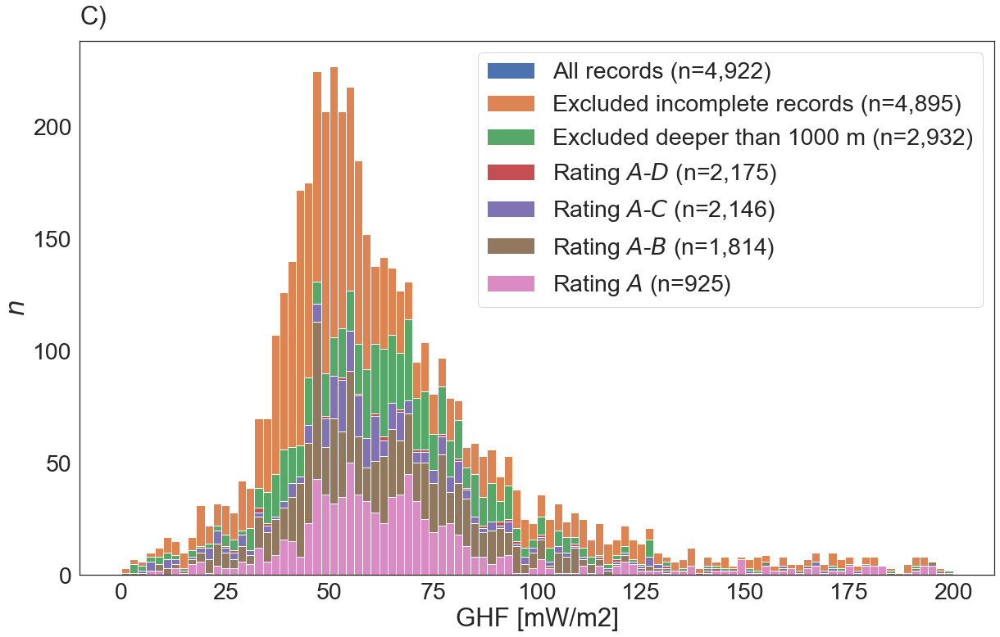

In [15]:

#create two datsets for A ratibng and b ratings
HGHF_file = dir_p / 'data' / 'dataset'/ 'Reference'/ 'q_Heat_flow'/'NGHF.csv'


hf = pd.read_csv(HGHF_file)
# change heat flow to mili

elev_cut = -1000



record_total_int = pd.read_csv(HGHF_file)

hf_afr_lat = record_total_int[record_total_int['latitude'].between(afr_lat_min, afr_lat_max, inclusive='both')]
record_total_afr = hf_afr_lat[hf_afr_lat['longitude'].between(afr_lon_min, afr_lon_max, inclusive='both')]



hf_no_pole_afr = record_total_afr.dropna(subset = ['longitude', 'latitude', 'heat-flow (mW/m2)'])



#hf_no_pole_afr = hf_clean[hf_clean['latitude'].between(world_lat_min, world_lat_max, inclusive='both')]
hf_deep_afr = hf_no_pole_afr[(hf_no_pole_afr['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]

hf_final_a_afr = hf_no_pole_afr[(hf_no_pole_afr ['code6']=='A') & (hf_no_pole_afr ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]
hf_final_b_afr= hf_no_pole_afr[(hf_no_pole_afr ['code6']=='B') & (hf_no_pole_afr ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]

hf_final_c_afr = hf_no_pole_afr[(hf_no_pole_afr ['code6']=='C') & (hf_no_pole_afr ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]
hf_final_d_afr = hf_no_pole_afr[(hf_no_pole_afr ['code6']=='D') & (hf_no_pole_afr ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]
hf_final_z_afr = hf_no_pole_afr[(hf_no_pole_afr ['code6']=='Z') & (hf_no_pole_afr ['elevation (m)']>elev_cut)][['longitude', 'latitude','heat-flow (mW/m2)']]


hf_extreme_a = hf_final_a_afr[hf_final_a_afr[target] >=200]
lon_hf_extreme_a = hf_extreme_a['longitude']
lat_hf_extreme_a = hf_extreme_a['latitude']

hf_extreme_b = hf_final_b_afr[hf_final_b_afr[target] >=200]
lon_hf_extreme_b = hf_extreme_b['longitude']
lat_hf_extreme_b = hf_extreme_b['latitude']

hf_extreme = hf_no_pole_afr[hf_no_pole_afr[target] >=200]
lon_hf_extreme = hf_extreme['longitude']
lat_hf_extreme = hf_extreme['latitude']


fig, ax = plt.subplots( figsize=(20, 12))
#print(plt.style.available)
#plt.style.use('_classic_test_patch')

sns.set(style='white', font_scale = 2.6)


record_total_afr[target].hist(bins=100, range = (0, 200), ax=ax,
                          label = f'All records (n={len(record_total_afr):,})')
                          
#hf_clean[target].hist(bins=100, range = (0, 200), ax=ax,
#                      label = f'Excluded incomplete records (n={len(hf_clean):,})')
hf_no_pole_afr[target].hist(bins=100, range = (0, 200), ax=ax,
                         label = f'Excluded incomplete records (n={len(hf_no_pole_afr):,})')
hf_deep_afr[target].hist(bins=100, range = (0, 200), ax=ax,
                         label = f'Excluded deeper than {abs(elev_cut)} m (n={len(hf_deep_afr):,})')

pd.concat([hf_final_a_afr[target], hf_final_b_afr[target], hf_final_c_afr[target], hf_final_d_afr[target]]).hist(
    bins=100, range = (0, 200), ax=ax,
                        label = f'Rating $A$-$D$ (n={len(hf_final_a_afr) + len(hf_final_b_afr) + len(hf_final_c_afr) + len(hf_final_d_afr):,})')
pd.concat([hf_final_a_afr[target], hf_final_b_afr[target], hf_final_c_afr[target]]).hist(
    bins=100,  range = (0, 200),ax=ax,
                        label = f'Rating $A$-$C$ (n={len(hf_final_a_afr) + len(hf_final_b_afr) + len(hf_final_c_afr):,})')
pd.concat([hf_final_a_afr[target], hf_final_b_afr[target]]).hist(
    bins=100,  range = (0, 200),ax=ax,
                        label = f'Rating $A$-$B$ (n={len(hf_final_a_afr) + len(hf_final_b_afr ):,})')
hf_final_a_afr[target].hist(bins=100,  range = (0, 200),ax=ax,
                        label = f'Rating $A$ (n={len(hf_final_a_afr):,})')




ax.set_title(f'{sub_figs[2]})', loc ='left', pad=20, )
ax.legend()
ax.set_ylabel(f'$n$')

ax.set_xlabel('GHF [mW/m2]')
    
ax.grid(False)
#ax.set_title('Distribution of different global GHF values', pad=40,)


fig.savefig(dir_p/'fig'/"fig_1b.jpeg", bbox_inches='tight', dpi=300 , pad_inches=0.2)

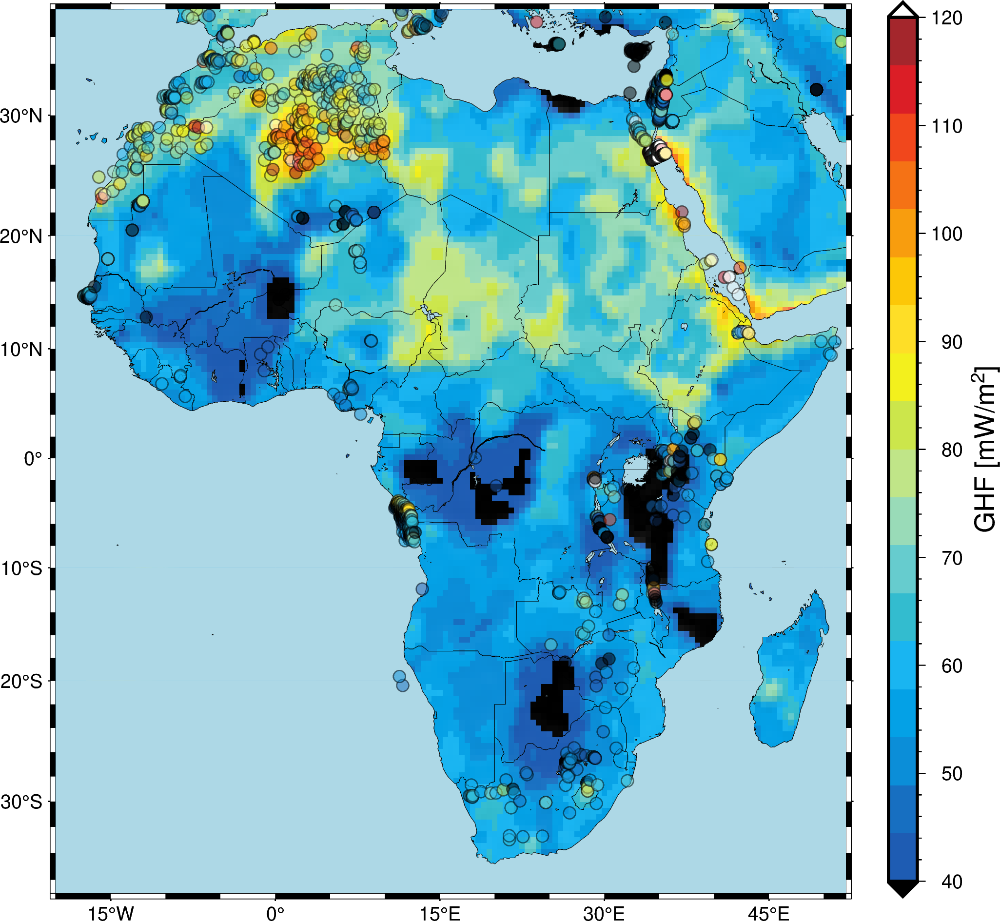

In [16]:


spacing = "0.5"

region_gmt = [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'


fig = pygmt.Figure()
with fig.subplot(
    nrows=1,
    ncols=1,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    #autolabel=['C)+o0.3/-1.2'],
    margins=["0c", "0.6c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    sharex="b",  # shared x-axis on the bottom side
    sharey='r',  # shared y-axis on the left side
    frame="lrtb",
):


    cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )
    
    with fig.set_panel(panel=[0, 0] ):


        fig.basemap(region=region_gmt, projection=proj, frame='WSne', panel=[0, 0])



        df_gmt = pygmt.blockmean(data=data_rab, region=region_gmt, spacing=spacing)
        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region_gmt,
             projection=proj,
                 cmap=cmap,
              #shading='+a45+nt0.5'
            shading=dgrid
        )

       
        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines= "0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
           
            #water='white',
            )
        fig.plot(x=hf_final_a.lon, y=hf_final_a.lat,  cmap=True, projection=proj,
             color=hf_final_a[target], transparency =50,
                      pen="0.5p,black", style="c0.21c")
        fig.plot(x=hf_final_b.lon, y=hf_final_b.lat,  cmap=True, projection=proj,
             color=hf_final_b[target],transparency =50,
                      pen="0.5p,black", style="c0.21c")


        fig.colorbar(frame=["af", "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_max +10)}/{str(afr_lat_min+1)}+w15c/0.5c+v+e")
        
    
        #fig.legend(position="g-23/-3", box=False)

fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_5.pdf", dpi=300 )


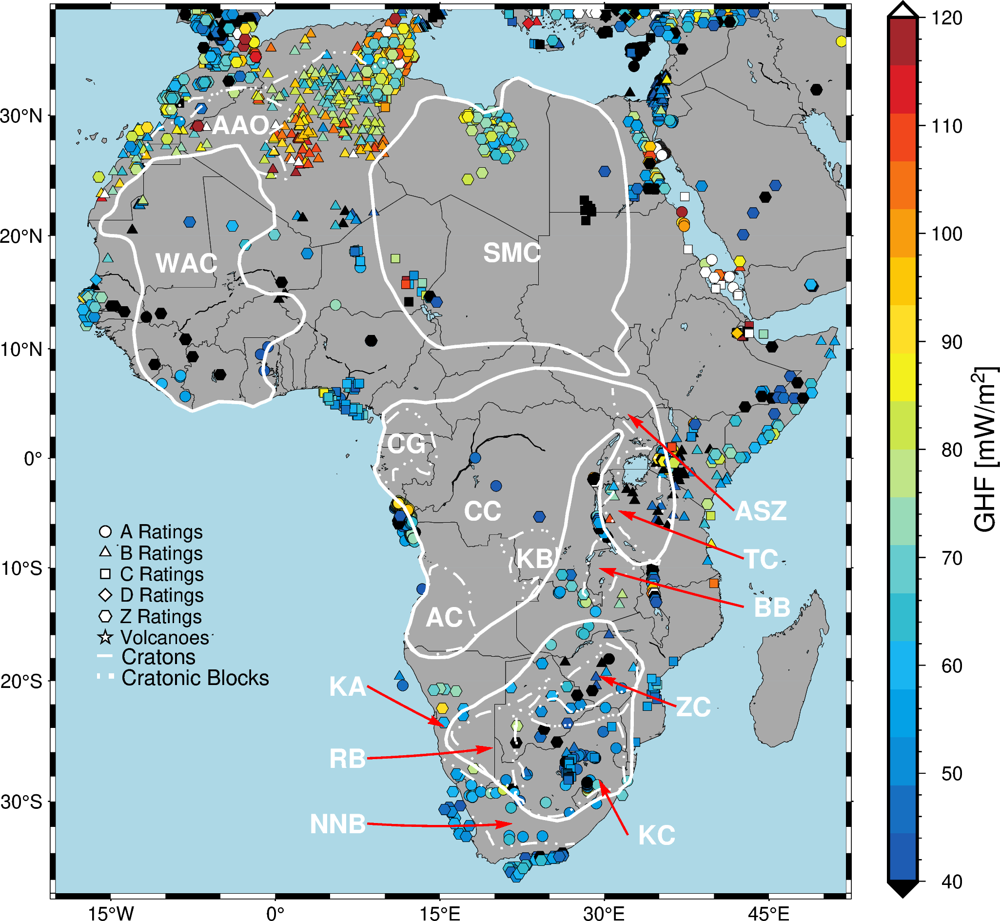

In [17]:

spacing = "0.5"


region_gmt= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]

proj = 'M5.4i'

tectonics_shp_main = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', ]]
labels_main = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics')
              if filename in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt']]

tectonics_shp_sub = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename not in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt',]
                    and 'gmt' in filename]
labels_sub = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics') 
             if filename not in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt',]
             and 'gmt' in filename]

volc_erup = pd.read_csv(dir_p/'GMT'/'tectonics'/'volcanic_eruptions.dat', sep='\s')
# congo co KA kalhari


fig = pygmt.Figure()
with fig.subplot(
    nrows=1,
    ncols=1,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    #autolabel=['A)+o0.3/-1.2'],
    margins=["0c", "0.6c"], # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    #sharex="b",  # shared x-axis on the bottom side
    #sharey=True,  # shared y-axis on the left side
    #frame="lrtb",
):


    with fig.set_panel(panel=[0, 0] ):
        #####RL
        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )


        fig.basemap(region=region_gmt, projection=proj, frame='WneS',  panel=[0, 0])

          
        
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"A Ratings"',
                      pen="0.5p", style="c0.2c")
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"B Ratings"',
                      pen="0.5p", style="t0.22c")        
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"C Ratings"',
                      pen="0.5p", style="s0.22c")   
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"D Ratings"',
                      pen="0.5p", style="d0.22c")        
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"Z Ratings"',
                      pen="0.5p", style="h0.22c") 
        fig.plot(x=volc_erup.Lon, y=volc_erup.Lat,  projection=proj,
             color='white', label=f'"Volcanoes"',
                      pen="0.5p", style="a0.25c")

        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            land='darkgrey'
           
            #water='white',
            )
     
        
        fig.plot(x=hf_final_a_afr.longitude, y=hf_final_a_afr.latitude,  cmap=True, projection=proj,
             color=hf_final_a_afr[target], #label=f"'A Rating'",
                      pen="0.1p,black", style="c0.19c")
        
        fig.plot(x=hf_final_b_afr.longitude, y=hf_final_b_afr.latitude,  cmap=True, projection=proj,
             color=hf_final_b_afr[target], #label="'B Rating'",
                      pen="0.1p,black", style="t0.21c")
        fig.plot(x=hf_final_c_afr.longitude, y=hf_final_c_afr.latitude,   cmap=True, projection=proj,
             color=hf_final_c_afr[target], #label="'C Rating'",
                      pen="0.1p,black", style="s0.21c")
        fig.plot(x=hf_final_d_afr.longitude, y=hf_final_d_afr.latitude,   cmap=True, projection=proj,
             color=hf_final_d_afr[target], #label="'B Rating'",
                      pen="0.1p,black", style="d0.21c")
        fig.plot(x=hf_final_z_afr.longitude, y=hf_final_z_afr.latitude,   cmap=True, projection=proj,
             color=hf_final_z_afr[target], #label="'C Rating'",
                      pen="0.1p,black", style="h0.21c")
        
        for shape, label in zip(tectonics_shp_main, labels_main):
            shape_xy = pd.read_csv(shape, header=None, sep='\s')
            fig.plot(x=shape_xy.iloc[:,0], y=shape_xy.iloc[:,1], projection=proj, 
                     region=region_gmt,   pen='1.5,white')      
           
  
        
        for shape, label in zip(tectonics_shp_sub, labels_sub):
            shape_xy = pd.read_csv(shape, header=None, sep='\s')
            fig.plot(x=shape_xy.iloc[:,0], y=shape_xy.iloc[:,1], projection=proj, 
                     region=region_gmt,   pen='1,white,..-')      
                          #pen="1p,red,--", style="c0.01i")
            #fig.text(x=shape_xy.iloc[:,0].min()+4, y=shape_xy.iloc[:,1].median()-2, font='15' ,text=label, justify="ML")

        
        fig.text(text="_", x=-20, y=-14.5, font="25p,Helvetica,white")
        fig.text(text="Cratons", x=-13.6, y=-15, font="10.5p,Helvetica,black")
        fig.text(text="...", x=-20, y=-17, font="25p,Helvetica,white")
        fig.text(text="Cratonic Blocks", x=-9.8, y=-17.1, font="10.5p,Helvetica,black")

        fig.colorbar(frame=["af","x+lGHF\t[mW/m@+2@+]"], 
                position=f"g{str(afr_lon_max +10)}/{str(afr_lat_min+1)}+w15c/0.5c+v+e")
        
        
        labels = [ 'KA', 
                  'NNB', 'KC', 'BB', 'TC', 'ASZ', 'ZC', 'RB']
        starts = [[8,-18], 
                  [8,-31],[35,-32],[47,-10],[47,-5],[46,0], [40,-20],[8,-25]]   
        
        starts_labels = [ [4,-18], 
                         [2,-31],[36,-32], [48,-10],[47,-5],[46,0], [40,-20],[4,-25],]   
        
        ends = [[16,-22], 
                [23,-31],[32,-27], [32,-6], [34,0], [35,10], [32,-17],[21,-24]]
        
        for start, end, label ,starts_label in zip(starts, ends, labels, starts_labels):
            style = "=0.3c+s+e+a30+gred+h0.3+p0.3p,red"
            data = np.array([start + end])
            fig.plot(data=data, style=style, pen="1.0p,red")

            fig.text(
                text=label, x=starts_label[0], y=starts_label[1], 
                font="13p,Helvetica-Bold,white" ,  justify="ML"
            )
            
        labels = [ 'WAC', 'SMC','CC', 'AAO', 'KB', 
                  'AC', 'CG']
        starts_labels = [[-14,25],  [20,26], [18,0],[-8.2,37.3],[23.4,-5], 
                         [14,-11], [10, 7],]  
        for label ,starts_label in zip(labels, starts_labels):
            fig.text(
                    text=label, x=starts_label[0], y=starts_label[1],  
                    font="13p,Helvetica-Bold,white" ,  justify="ML"
                )

    fig.legend(position="g-25/-15", box=False)
fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_4.pdf", dpi=300 )

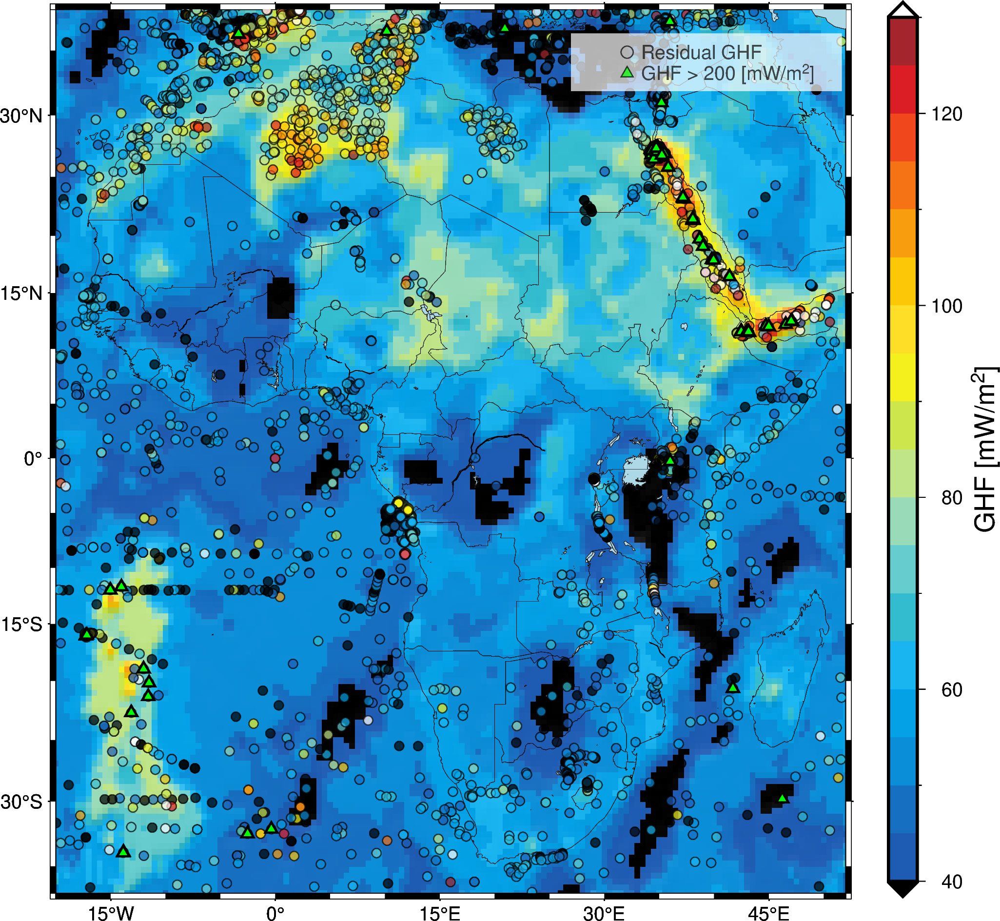

In [39]:


spacing = "0.5"

proj = 'M5.4i'
region_gmt= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]

    
tectonics_shp_main = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename in ['CC.gmt', 'BB.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', 'AAO.gmt', 'RTA.gmt']]
labels_main = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics')
              if filename in ['CC.gmt', 'BB.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', 'AAO.gmt', 'RTA.gmt']]

tectonics_shp_sub = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename not in ['CC.gmt', 'BB.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', 'AAO.gmt', 'RTA.gmt']
                    and 'gmt' in filename]
labels_sub = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics') 
             if filename not in ['CC.gmt', 'BB.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', 'AAO.gmt', 'RTA.gmt']
             and 'gmt' in filename]

volc_erup = pd.read_csv(dir_p/'GMT'/'tectonics'/'volcanic_eruptions.dat', sep='\s')
# congo co KA kalhari


fig = pygmt.Figure()
with fig.subplot(
    nrows=1,
    ncols=1,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    #autolabel=['C)+o0.3/-1.2'],
    margins=["0c", "0c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    #sharex="bt",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    #frame="WSrt",
):


    cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/130',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )
    
    with fig.set_panel(panel=[0, 0] ):
        #####RL

        


        fig.basemap(region=region_gmt, projection=proj, frame=True,  panel=[0, 0])
       
       
        fig.plot(x=0, y=0,  projection=proj, cmap=False,
              label='"Residual GHF"',
                      pen="0.5p", style="c0.21c")
        fig.plot(x=0, y=0,  projection=proj,
             color='green', label='"GHF > 200\t[mW/m@+2@+]"',
                      pen="0.5p", style="t0.24c")
        
        '''
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"C Ratings"',
                      pen="0.5p", style="s0.22c")  '''   
        

        df_gmt = pygmt.blockmean(data=data_rab, region=region_gmt, spacing=spacing)
        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region_gmt,
             projection=proj,
                 cmap=cmap,
             frame=True,
            #shading='+a45+nt0.5'
            shading=dgrid
        )

        
        fig.coast(
            projection=proj,
            #shorelines=0.5,
            #water="lightblue", 
            #water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #land='darkgrey'
           
            #water='white',
            )

        
        fig.plot(x=hf_no_pole_afr.longitude.values, y=hf_no_pole_afr.latitude.values,  
                 cmap=True, projection=proj, transparency =30,
             color=hf_no_pole_afr[target].values, #label="'C Rating'",
                      pen="0.5p,black", style="c0.16c")
        
        fig.plot(x=lon_hf_extreme , y=lat_hf_extreme ,    projection=proj,                               
                 color=  'green' ,         pen="1p,black", style="t0.24c")
        
      
    

                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af", "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_max +10)}/{str(afr_lat_min+1)}+w15c/0.5c+v+e")

       

        fig.legend(position="g29.1/40+w4.7/1", box='+gwhite', transparency=30)

   
fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_s8.pdf", dpi=300 )

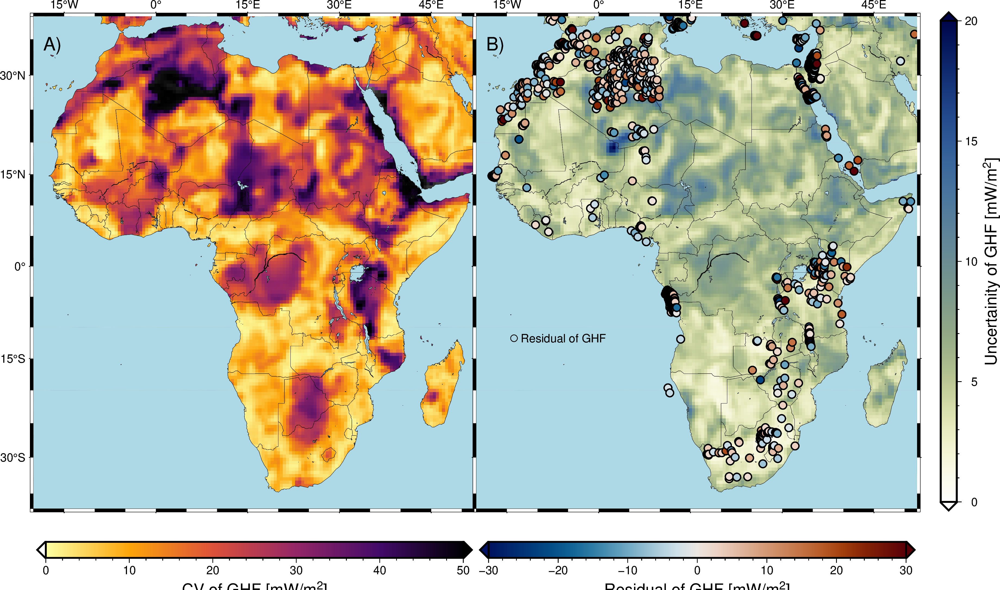

In [19]:

    

spacing = "0.5"


region= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'



fig = pygmt.Figure()
with fig.subplot(
    nrows=1,
    ncols=2,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    autolabel=['A)+o0.3/-1.2'],
    margins=["0c", "2.4c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    #sharex="bt",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    #frame="WSrt",
):


           
    with fig.set_panel(panel=[0, 0]):


        cmap = pygmt.makecpt(
            cmap='inferno', #temp 19lev
            series='0/50/10',
            continuous=True,
            reverse=True,)



        fig.basemap(region=region, projection=proj, frame='WsNe',  panel=[0, 0])

        df_gmt = pygmt.blockmean(data=data_RSD_rab, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lCV\tof\tGHF\t[mW/m@+2@+]"],
           position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-7)}+w13c/0.5c+h+e")
        
        
        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,

            #water='white',
            )
        
        

   
    with fig.set_panel(panel=[0, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='davos', #temp 19lev
            series=f"0/20/1",
            continuous=True,
            reverse=True,
        )

        fig.basemap(region=region, projection=proj, frame='eNsw',   panel=[0, 1])
        '''
        fig.plot(x=0, y=0,  projection=proj,
             color='green', label='"GHF > 200\t[mW/m@+2@+]"',
                      pen="0.5p", style="t0.24c")'''
        fig.plot(x=0, y=0,  projection=proj, cmap=False,
              label='"Residual of GHF"',
                      pen="0.5p", style="c0.21c")


        df_gmt = pygmt.blockmean(data=data_UNC_rab, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )

        fig.colorbar(frame=["af",  "x+lUncertainity\tof\tGHF\t[mW/m@+2@+]"],
                 position=f"g{str(afr_lon_max +10)}/{str(afr_lat_min+1)}+w15c/0.5c+v+e") 
        
        cmap= pygmt.makecpt(
                    cmap='vik', #temp 19lev
                    series=f"-30/30/3",
                    continuous=True,
                    reverse=False,
                )


        '''
        fig.plot(x=gt_Afr_ra_lon, y=gt_Afr_ra_lat,   cmap=True, projection=proj,                                
                 color=  resid_ra , label=cmap,
                              pen="1p,black", style="c0.24c")'''
        fig.plot(x=gt_Afr_rab_lon, y=gt_Afr_rab_lat,   cmap=True, projection=proj,                                
                 color=  resid_rab , label=cmap,
                              pen="1p,black", style="c0.24c")      
        '''
        fig.plot(x=lon_hf_extreme_a, y=lat_hf_extreme_a,    projection=proj,                               
                 color=  'green' ,         pen="1p,black", style="t0.24c")
        fig.plot(x=lon_hf_extreme_b, y=lat_hf_extreme_b,    projection=proj,                               
                 color=  'green' ,         pen="1p,black", style="t0.24c")'''

                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lResidual\tof\tGHF\t[mW/m@+2@+]"],
                 position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-7)}+w13c/0.5c+h+e")
        
        fig.legend(position="g-23/-10", box=False)

fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_7.pdf", dpi=300 )

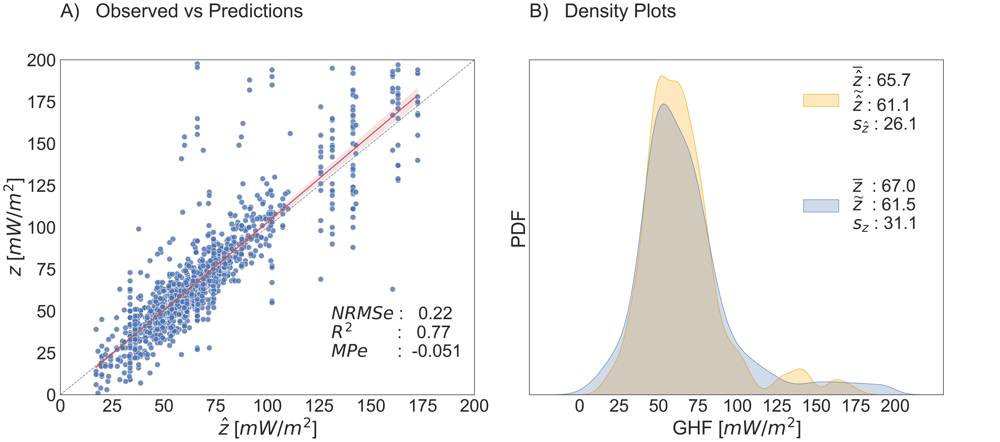

In [37]:
def add_identity(axes, *line_args, **line_kwargs):
    identity, = axes.plot([], [], *line_args, **line_kwargs)
    def callback(axes):
        low_x, high_x = axes.get_xlim()
        low_y, high_y = axes.get_ylim()
        low = max(low_x, low_y)
        high = min(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(axes)
    axes.callbacks.connect('xlim_changed', callback)
    axes.callbacks.connect('ylim_changed', callback)
    return axes

KPI_df = pd.DataFrame()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(32,15), dpi=300)

# Seaborn setting                                                                                                                                              
#sns.set(style='white',  font_scale = 3)

sns.set(style='white',  font_scale = 3.5)
#parameters = {'axes.labelsize': 35,
#          'axes.titlesize': 35}
#plt.rcParams.update(parameters)
font_size = 30

point_size = 150

#####
errors      = abs(y_test_rab - y_pred_rab)
errors     = abs(y_test_rab - y_pred_rab)
mape        = round( mean_absolute_percentage_error(y_test_rab, y_pred_rab), 2) 
accuracy    = round(100 - mape *100, 3)
mae         = round(mean_absolute_error(y_test_rab, y_pred_rab ), 1)
rmse        = round(mean_squared_error(y_test_rab, y_pred_rab , squared=False), 1)
nrmse       = round( rmse/(y_test_rab.mean()) , 2) 
r2          = round(r2_score(y_test_rab, y_pred_rab ), 2)
ev          = round( explained_variance_score(y_test_rab, y_pred_rab), 3)
mnae        = round( median_absolute_error(y_test_rab, y_pred_rab), 3) 
mpe         =  round(np.mean((y_test_rab -y_pred_rab)/y_test_rab) , 3)
ccc         = round(concordance_correlation_coefficient(y_test_rab, y_pred_rab),2)
bias        = round(y_pred_rab.mean() - y_test_rab.mean(), 2)
max_e       = round( max_error(y_test_rab, y_pred_rab), 0)
min_e       = round( errors.min(), 3)
Max         = round(y_pred_rab.max(), 0)
Min         = round(y_pred_rab.min(), 0)

rsd         = round(np.std(y_pred_rab) / np.mean(y_pred_rab) ,3)

rmse_rl        = round(mean_squared_error(y_test_rab, y_pred_rab , squared=False), 1)
max_e      = round( max_error(y_test_rab, y_pred_rab), 0)
min_e      = round( errors.min(), 3)
Max        = round(y_pred_rab.max(), 0)
Min        = round(y_pred_rab.min(), 0)

KPI_df.loc['NRMSE', f'RF_{label_rab[0][-9:]}'] = nrmse
KPI_df.loc['RMSE', f'RF_{label_rab[0][-9:]}'] = rmse
KPI_df.loc['MAE', f'RF_{label_rab[0][-9:]}'] = mae
KPI_df.loc['MAPE', f'RF_{label_rab[0][-9:]}'] = mape
KPI_df.loc['CD', f'RF_{label_rab[0][-9:]}'] = r2
KPI_df.loc['EV', f'RF_{label_rab[0][-9:]}'] = ev
KPI_df.loc['MAX_E', f'RF_{label_rab[0][-9:]}'] = max_e
KPI_df.loc['MIN_E', f'RF_{label_rab[0][-9:]}'] = min_e
KPI_df.loc['MedAE', f'RF_{label_rab[0][-9:]}'] = mnae
KPI_df.loc['MPE', f'RF_{label_rab[0][-9:]}'] = mpe
KPI_df.loc['ACC', f'RF_{label_rab[0][-9:]}'] = accuracy
KPI_df.loc['MAX', f'RF_{label_rab[0][-9:]}'] = Max    
KPI_df.loc['RSD', f'RF_{label_rab[0][-9:]}'] = rsd
KPI_df.loc['CCC', f'RF_{label_rab[0][-9:]}'] = ccc
KPI_df.loc['BIAS', f'RF_{label_rab[0][-9:]}'] = bias

KPI_df.loc['RI', f'RF_{label_rab[0][-9:]}'] = (rmse_rl - rmse)/rmse_rl * 100


sns.regplot(x=y_pred_rab, y=y_test_rab,    ax= axes[0], 
            line_kws={"color": "r"} , scatter_kws={ "edgecolor":"w", 's':point_size, },
            
             
     label=  
     f"""     
     $NRMSe$ :   {nrmse} 
     $R^2$         :   {r2}
     $MPe$      :  {mpe}
     """)
#$R_i$          :  {round((rmse_rl - rmse)/rmse_rl,3)}
add_identity(axes[0], color='grey', ls='--')
#mn = min(plt.gca().axis()) and mx = max(plt.gca().axis())

'''sns.scatterplot(x=y_pred_rab[mask],y=y_test_rab[mask], color="red", 
                s=point_size,  ax= axes[0], edgecolor="white", 
               #label= "Mae > 15"  
               )'''
axes[0].set(xlabel='$\hat{z}$ [$mW/m^{2}$]',ylabel='$z$ [$mW/m^{2}$]')
axes[0].set_title(f"{sub_figs[0]})   Observed vs Predictions", loc ='left', pad=20,   y=1.1)
axes[0].set_xlim([0, 200])
axes[0].set_ylim([0, 200])
axes[0].set_xticks([0, 25, 50, 75, 100, 125, 150, 175, 200])

#bbox_to_anchor=(2, 0), 
axes[0].legend( frameon=False,loc="lower right")
for lh in axes[0].get_legend().legendHandles: 
    lh._sizes = [0] 


####
mean= "$\overline{\hat{z}}$"
median= "$\widetilde{\hat{z}}$"
std= "$s_{\hat{z}}$"

sns.kdeplot(y_pred_rab,  ax =axes[1],fill=True, 
            color="orange", label=f'''
{mean} : {round(y_pred_rab.mean(),1)}
{median} : {round(np.median(y_pred_rab),1)}
{std} : {round(y_pred_rab.std(),1)}
                            ''')
#axes[1].axvline(x=y_pred_rab.mean() , c='b')


          
#axes[1].axvline(x=y_pred_rab.mean() , c='g')

mean_t = "$\overline{z}$"
median_t = "$\widetilde{z}$"
std_t = "$s_{z}$"

sns.kdeplot(y_test_rab,  ax =axes[1],fill=True, 
            color="b", label=f'''
{mean_t}  : {round(y_test_rab.mean(),1)}
{median_t}  : {round(np.median(y_test_rab),1)}
{std_t} : {round(y_test_rab.std(),1)}
                            ''')
#axes[1].axvline(x=y_test_rab.mean() , c='r')

axes[1].legend( frameon=False, bbox_to_anchor=(1.15, 1.08))
axes[1].set_yticks([]) 

axes[1].set(xlabel='GHF [$mW/m^{2}$]',ylabel='PDF' )

axes[1].set_title(f'{sub_figs[1]})   Density Plots', loc ='left', pad=20,   y=1.1)
axes[1].set_xticks([0, 25, 50, 75, 100, 125, 150, 175, 200])
###
     

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
plt.tight_layout()

fig.savefig(dir_p/'fig'/"fig_6.pdf", bbox_inches='tight', dpi=300 )

In [21]:
region = 'Afr'




sub_figs = list('ABCDEFGHIJKLMNOPQRSTUVWXYZ')




file_rfe = '04'


label_ra = [ label for label in labels_ra if file_rfe in label]
label_rab = [ label for label in labels_rab if file_rfe in label]



Afr_Q_rab_04 = pd.DataFrame(grids[region].ds[f'{label_rab[0]}'].T.values.reshape(-1,1))
Afr_Q_ra_04 = pd.DataFrame(grids[region].ds[f'{label_ra[0]}'].T.values.reshape(-1,1))




lon = pd.DataFrame(grids[region].lon.T.reshape(-1,1))
lat = pd.DataFrame(grids[region].lat.T.reshape(-1,1))

df_Afr_rab_04 = pd.concat([lon, lat, Afr_Q_rab_04, 
                          ] , axis=1).dropna()
df_Afr_rab_04.columns = ['lon', 'lat','Q_RF', ]


df_Afr_ra_04 = pd.concat([lon, lat, Afr_Q_ra_04, 
                          ] , axis=1).dropna()
df_Afr_ra_04.columns = ['lon', 'lat','Q_RF', ]



df_Afr_rab_04 = df_Afr_rab_04[['lon', 'lat','Q_RF']]
data_rab_04 = df_Afr_rab_04.values

df_Afr_ra_04 = df_Afr_ra_04[['lon', 'lat','Q_RF']]
data_ra_04 = df_Afr_ra_04.values


df_Afr_Diff_rab_04 = df_Afr_rab_04[['lon', 'lat']]
df_Afr_Diff_rab_04['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_rab_04['Q_RF']
data_Diff_rab_04 =  df_Afr_Diff_rab_04.values 

df_Afr_Diff_ra_04 = df_Afr_ra_04[['lon', 'lat']]
df_Afr_Diff_ra_04['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_ra_04['Q_RF']
data_Diff_ra_04 =  df_Afr_Diff_ra_04.values 


#####



file_rfe = '16'


label_ra = [ label for label in labels_ra if file_rfe in label]
label_rab = [ label for label in labels_rab if file_rfe in label]


Afr_Q_rab_16 = pd.DataFrame(grids[region].ds[f'{label_rab[0]}'].T.values.reshape(-1,1))
Afr_Q_ra_16 = pd.DataFrame(grids[region].ds[f'{label_ra[0]}'].T.values.reshape(-1,1))



lon = pd.DataFrame(grids[region].lon.T.reshape(-1,1))
lat = pd.DataFrame(grids[region].lat.T.reshape(-1,1))

df_Afr_rab_16 = pd.concat([lon, lat, Afr_Q_rab_16, 
                          ] , axis=1).dropna()
df_Afr_rab_16.columns = ['lon', 'lat','Q_RF', ]

df_Afr_ra_16 = pd.concat([lon, lat, Afr_Q_ra_16, 
                          ] , axis=1).dropna()
df_Afr_ra_16.columns = ['lon', 'lat','Q_RF', ]

df_Afr_rab_16 = df_Afr_rab_16[['lon', 'lat','Q_RF']]
data_rab_16 = df_Afr_rab_16.values

df_Afr_ra_16 = df_Afr_ra_16[['lon', 'lat','Q_RF']]
data_ra_16 = df_Afr_ra_16.values


df_Afr_Diff_rab_16 = df_Afr_rab_16[['lon', 'lat']]
df_Afr_Diff_rab_16['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_rab_16['Q_RF']
data_Diff_rab_16 =  df_Afr_Diff_rab_16.values 

df_Afr_Diff_ra_16 = df_Afr_ra_16[['lon', 'lat']]
df_Afr_Diff_ra_16['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_ra_16['Q_RF']
data_Diff_ra_16 =  df_Afr_Diff_ra_16.values 


####



file_rfe = '09'


label_ra = [ label for label in labels_ra if file_rfe in label]
label_rab = [ label for label in labels_rab if file_rfe in label]


Afr_Q_rab_09 = pd.DataFrame(grids[region].ds[f'{label_rab[0]}'].T.values.reshape(-1,1))
Afr_Q_ra_09 = pd.DataFrame(grids[region].ds[f'{label_ra[0]}'].T.values.reshape(-1,1))


lon = pd.DataFrame(grids[region].lon.T.reshape(-1,1))
lat = pd.DataFrame(grids[region].lat.T.reshape(-1,1))

df_Afr_rab_09 = pd.concat([lon, lat, Afr_Q_rab_09, 
                          ] , axis=1).dropna()
df_Afr_rab_09.columns = ['lon', 'lat','Q_RF', ]

df_Afr_ra_09 = pd.concat([lon, lat, Afr_Q_ra_09, 
                          ] , axis=1).dropna()
df_Afr_ra_09.columns = ['lon', 'lat','Q_RF', ]


df_Afr_rab_09 = df_Afr_rab_09[['lon', 'lat','Q_RF']]
data_rab_09 = df_Afr_rab_09.values

df_Afr_ra_09 = df_Afr_ra_09[['lon', 'lat','Q_RF']]
data_ra_09 = df_Afr_ra_09.values


df_Afr_Diff_rab_09 = df_Afr_rab_09[['lon', 'lat']]
df_Afr_Diff_rab_09['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_rab_09['Q_RF']
data_Diff_rab_09 =  df_Afr_Diff_rab_09.values 

df_Afr_Diff_ra_09 = df_Afr_ra_09[['lon', 'lat']]
df_Afr_Diff_ra_09['Q_Diff'] = df_Afr_rab['Q_RF'] - df_Afr_ra_09['Q_RF']
data_Diff_ra_09 =  df_Afr_Diff_ra_09.values 




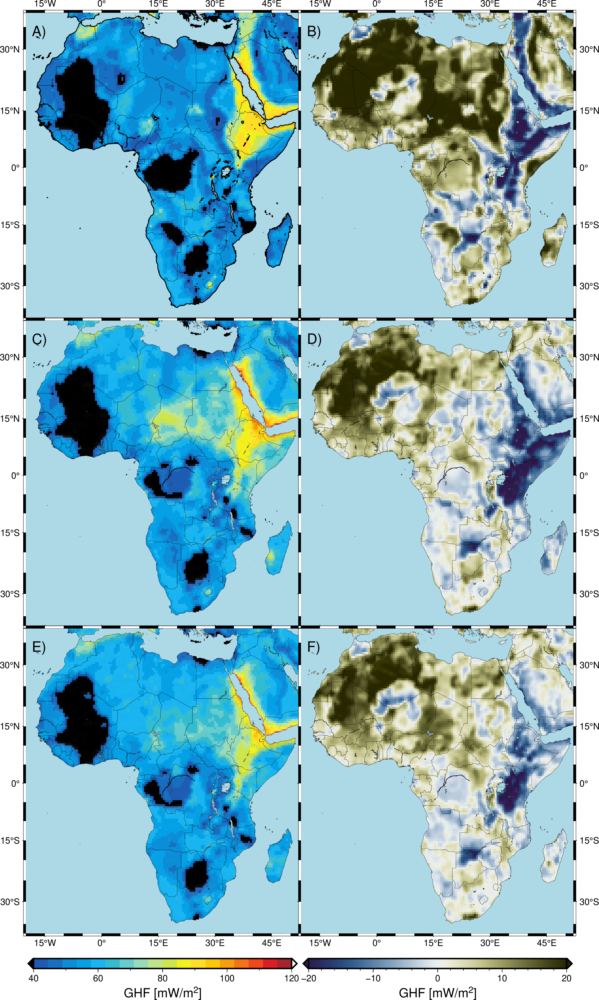

In [22]:

spacing = "0.5"


region= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'


fig = pygmt.Figure()
with fig.subplot(
    nrows=4,
    ncols=2,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    autolabel=['A)+o0.3/-1.2'],
    margins=["0.18c", "1c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    sharex="b",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    frame="lrtb",
):


    #####Kriging
    with fig.set_panel(panel=[0, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/ 'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj, frame='WNse', panel=[0, 0])

        df_gmt = pygmt.blockmean(data=data_ra_04, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", shorelines="1p,black",
            borders=["1/0.2p,black"],
            #water='white',
            )


   
    with fig.set_panel(panel=[0, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )

        fig.basemap(region=region, projection=proj, frame='ENsw',  panel=[0, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_ra_04, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
    

    with fig.set_panel(panel=[1, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj,  panel=[1, 0])

        df_gmt = pygmt.blockmean(data=data_ra_09, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


   
    with fig.set_panel(panel=[1, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )


        fig.basemap(region=region, projection=proj,   panel=[1, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_ra_09, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
            
    with fig.set_panel(panel=[2, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj, frame='WSne',  panel=[2, 0])

        df_gmt = pygmt.blockmean(data=data_ra_16, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8)}+w13c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


   
    with fig.set_panel(panel=[2, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )


        fig.basemap(region=region, projection=proj, frame='ESnw',  panel=[2, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_ra_16, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8)}+w13c/0.5c+h+e")
            

fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_s5.pdf", dpi=300 )

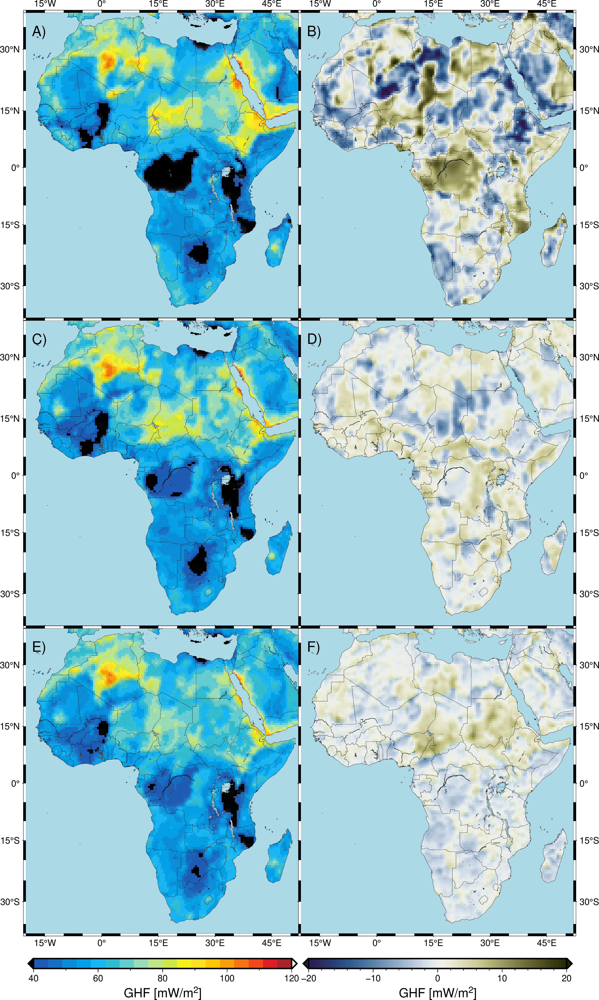

In [23]:

spacing = "0.5"


region= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'


fig = pygmt.Figure()
with fig.subplot(
    nrows=4,
    ncols=2,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    autolabel=['A)+o0.3/-1.2'],
    margins=["0.18c", "1c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    sharex="b",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    frame="lrtb",
):


    #####Kriging
    with fig.set_panel(panel=[0, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/ 'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj, frame='WNse', panel=[0, 0])

        df_gmt = pygmt.blockmean(data=data_rab_04, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


   
    with fig.set_panel(panel=[0, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )

        fig.basemap(region=region, projection=proj, frame='ENsw',  panel=[0, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_rab_04, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
    

    with fig.set_panel(panel=[1, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj,  panel=[1, 0])

        df_gmt = pygmt.blockmean(data=data_rab_09, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


   
    with fig.set_panel(panel=[1, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )


        fig.basemap(region=region, projection=proj,   panel=[1, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_rab_09, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min+2)}/{str(afr_lat_min-6)}+w12c/0.5c+h+e")
            
    with fig.set_panel(panel=[2, 0]):



        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )



        fig.basemap(region=region, projection=proj, frame='WSne',  panel=[2, 0])

        df_gmt = pygmt.blockmean(data=data_rab_16, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )
                #frame=["+LGHF", "xaf", "y+l(%)"]
        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8)}+w13c/0.5c+h+e")
        
        


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


   
    with fig.set_panel(panel=[2, 1] ):
        #####RL

        cmap= pygmt.makecpt(
            cmap='broc', #temp 19lev
            series=f"-20/20/1",
            continuous=True,
            reverse=False,
        )


        fig.basemap(region=region, projection=proj, frame='ESnw',  panel=[2, 1])


        df_gmt = pygmt.blockmean(data=data_Diff_rab_16, region=region, spacing=spacing)

        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region,
             projection=proj,
                 cmap=cmap,
             
            #shading='+a45+nt0.5'
            shading=dgrid
        )



        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #water='white',
            )


 

        fig.colorbar(frame=["af",  "x+lGHF\t[mW/m@+2@+]"],
                     position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8)}+w13c/0.5c+h+e")
            

fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_s6.pdf", dpi=300 )

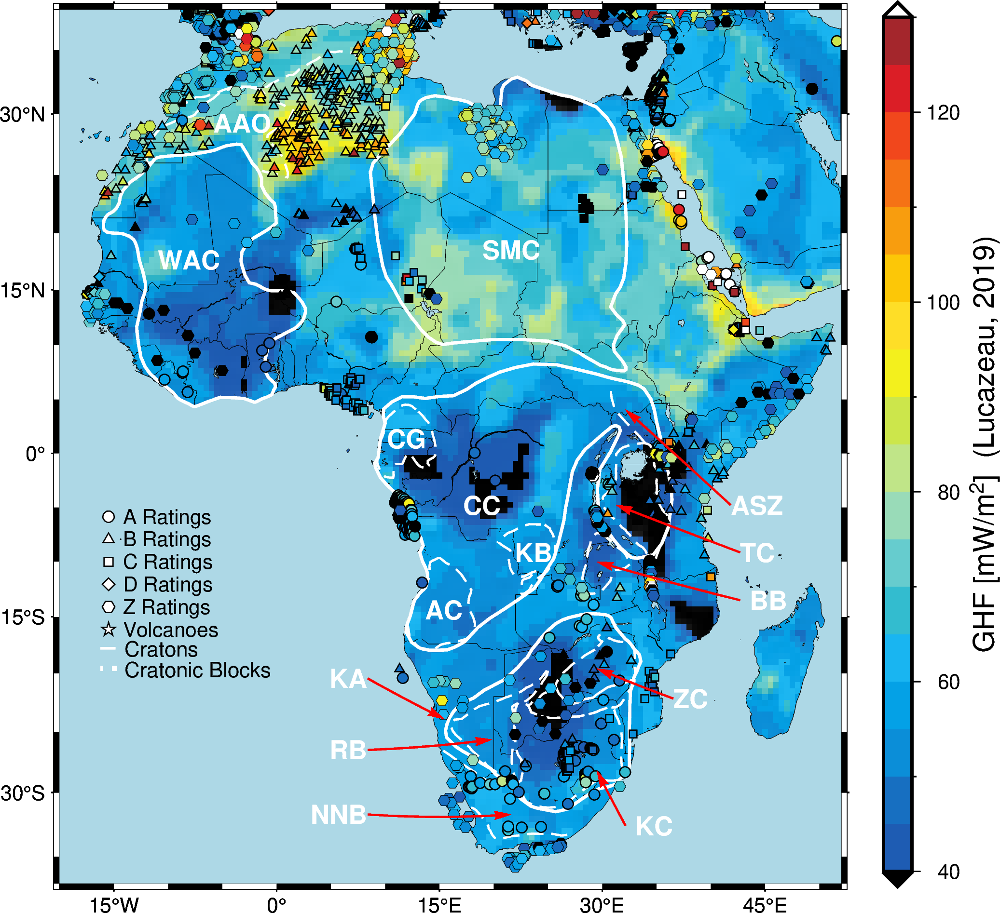

In [24]:


spacing = "0.5"

region_gmt= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'
    
    
tectonics_shp_main = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt', ]]
labels_main = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics')
              if filename in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt']]

tectonics_shp_sub = [dir_p/'GMT'/'tectonics'/f'{filename}' \
         for filename in os.listdir(dir_p/'GMT'/'tectonics')
                   if filename not in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt',]
                    and 'gmt' in filename]
labels_sub = [filename[:-4]  for filename in os.listdir(dir_p/'GMT'/'tectonics') 
             if filename not in ['CC.gmt', 'WAC.gmt', 'SMC.gmt', 'KA.gmt',]
             and 'gmt' in filename]

volc_erup = pd.read_csv(dir_p/'GMT'/'tectonics'/'volcanic_eruptions.dat', sep='\s')


# congo co KA kalhari


fig = pygmt.Figure()
with fig.subplot(
    nrows=1,
    ncols=2,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    #autolabel=['C)+o0.3/-1.2'],
    margins=["0c", "0c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    #sharex="bt",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    #frame="WSrt",
):


    cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
        #cmap='lajolla',
            series='40/130',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )
    
    with fig.set_panel(panel=[0, 0] ):
        #####RL

        


        fig.basemap(region=region_gmt, projection=proj, frame=True,  panel=[0, 0])
       
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"A Ratings"',
                      pen="0.5p", style="c0.2c")
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"B Ratings"',
                      pen="0.5p", style="t0.22c")        
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"C Ratings"',
                      pen="0.5p", style="s0.22c")   
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"D Ratings"',
                      pen="0.5p", style="d0.22c")        
        fig.plot(x=0, y=0,  projection=proj,
             color='white', label=f'"Z Ratings"',
                      pen="0.5p", style="h0.22c") 
        fig.plot(x=volc_erup.Lon, y=volc_erup.Lat,  projection=proj,
             color='white', label=f'"Volcanoes"',
                      pen="0.5p", style="a0.25c")




        df_gmt = pygmt.blockmean(data=data_rab, region=region_gmt, spacing=spacing)
        grd = pygmt.surface(
             data=df_gmt, # xarray.DataArray containing VSV values
        spacing=spacing
        )

        dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

        fig.grdimage(
             grid=grd, # xarray.DataArray containing VSV values
             region=region_gmt,
             projection=proj,
                 cmap=cmap,
             frame=True,
            #shading='+a45+nt0.5'
            shading=dgrid
        )

        fig.coast(
            projection=proj,
            #shorelines=0.5,
            #water="lightblue", 
            water="lightblue", 
            shorelines="0.01p,black",
            borders=["1/0.01p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            #land='darkgrey'
           
            #water='white',
            )
        
        
        fig.text(text="_", x=-20, y=-14.5, font="25p,Helvetica,white")
        fig.text(text="Cratons", x=-13.6, y=-15, font="10.5p,Helvetica,black")
        fig.text(text="...", x=-20, y=-17, font="25p,Helvetica,white")
        fig.text(text="Cratonic Blocks", x=-9.8, y=-17.1, font="10.5p,Helvetica,black")
        
        for shape, label in zip(tectonics_shp_sub, labels_sub):
            shape_xy = pd.read_csv(shape, header=None, sep='\s')
            fig.plot(x=shape_xy.iloc[:,0], y=shape_xy.iloc[:,1], projection=proj,  region=region_gmt,   pen='1,white,--')      
                          #pen="1p,red,--", style="c0.01i")
            #fig.text(x=shape_xy.iloc[:,0].min()+4, y=shape_xy.iloc[:,1].median()-2, font='15' ,text=label, justify="ML")
            
        
        
        for shape, label in zip(tectonics_shp_main, labels_main):
            shape_xy = pd.read_csv(shape, header=None, sep='\s')
            fig.plot(x=shape_xy.iloc[:,0], y=shape_xy.iloc[:,1], projection=proj,  region=region_gmt,   pen='1.5,white')      
                          #pen="1p,red,--", style="c0.01i")
                
        
        fig.plot(x=hf_final_a.lon, y=hf_final_a.lat,  cmap=True, projection=proj,
             color=hf_final_a[target], #label=f"'A Rating'",
                      pen="0.5p,black", style="c0.19c")
        
        fig.plot(x=hf_final_b.lon, y=hf_final_b.lat,  cmap=True, projection=proj,
             color=hf_final_b[target], #label="'B Rating'",
                      pen="0.5p,black", style="t0.19c")
        fig.plot(x=hf_final_c.lon, y=hf_final_c.lat,  cmap=True, projection=proj,
             color=hf_final_c[target], #label="'B Rating'",
                      pen="0.5p,black", style="s0.19c")
        
        fig.plot(x=hf_final_d.lon, y=hf_final_d.lat,  cmap=True, projection=proj,
             color=hf_final_d[target], #label="'B Rating'",
                      pen="0.5p,black", style="d0.19c")
        fig.plot(x=hf_final_z_afr.longitude, y=hf_final_z_afr.latitude,   cmap=True, projection=proj,
             color=hf_final_z_afr[target], #label="'C Rating'",
                      pen="0.1p,black", style="h0.21c")
       

        fig.colorbar(frame=["af", "x+lGHF\t[mW/m@+2@+]\t\t(Lucazeau,\t2019)"], 
                     position=f"g{str(afr_lon_max +10)}/{str(afr_lat_min+1)}+w15c/0.5c+v+e")
    
        labels = [ 'KA', 
                  'NNB', 'KC', 'BB', 'TC', 'ASZ', 'ZC', 'RB']
        starts = [[8,-18], 
                  [8,-31],[35,-32],[47,-10],[47,-5],[46,0], [40,-20],[8,-25]]   
        
        starts_labels = [ [4,-18], 
                         [2,-31],[36,-32], [48,-10],[47,-5],[46,0], [40,-20],[4,-25],]   
        
        ends = [[16,-22], 
                [23,-31],[32,-27], [32,-6], [34,0], [35,10], [32,-17],[21,-24]]
        
        for start, end, label ,starts_label in zip(starts, ends, labels, starts_labels):
            style = "=0.3c+s+e+a30+gred+h0.3+p0.3p,red"
            data = np.array([start + end])
            fig.plot(data=data, style=style, pen="1.0p,red")

            fig.text(
                text=label, x=starts_label[0], y=starts_label[1], 
                font="13p,Helvetica-Bold,white" ,  justify="ML"
            )
            
        labels = [ 'WAC', 'SMC','CC', 'AAO', 'KB', 
                  'AC', 'CG']
        starts_labels = [[-14,25],  [20,26], [18,0],[-8.2,37.3],[23.4,-5], 
                         [14,-11], [10, 7],]  
        for label ,starts_label in zip(labels, starts_labels):
            fig.text(
                    text=label, x=starts_label[0], y=starts_label[1],  
                    font="13p,Helvetica-Bold,white" ,  justify="ML"
                )
       


        #fig.legend(position="g29.1/40+w4.7/1", box='+gwhite', transparency=30)
        fig.legend(position="g-25/-15", box=False)

   
fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_s7.pdf", dpi=300 )

# RFECV

Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.


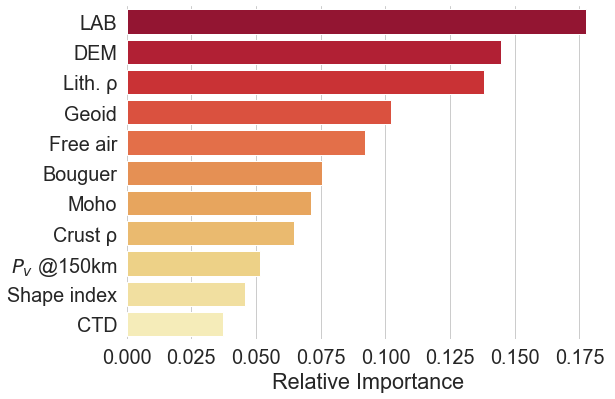

In [25]:
#feature importance 
# Get selected features data set
# should be scaled

# Set figure size and create barplot
sns.set(style="whitegrid", color_codes=True, font_scale = 1.8)
fig, ax = plt.subplots(figsize=(9, 6))


file_label ='OD_rab'
best_features = 11

# Load hyper parameter 
X = training_Afr_rab[features]
y =training_Afr_rab[target]

X['GLIM']  = X['GLIM'].astype('category')
X['REG']  = X['REG'].astype('category')

 # hyperparameter
bs_rfr_hyp =  dir_p/'Hyperparameters'/f'RFR_{file_label}.csv'


bs_rfr_hyp_df = pd.read_csv(bs_rfr_hyp, sep='\t')


best_params = bs_rfr_hyp_df.to_dict('list')


# Load hyper parameter 

regressor = RandomForestRegressor()

tuned_params = {item[11:]: best_params[item][0] for item in best_params}
regressor.set_params(**tuned_params)

rfe = RFE(regressor, n_features_to_select = best_features, step = 1, verbose = 1)
selected_features = rfe.fit(X, y).get_feature_names_out()


regressor.fit(X[selected_features],y)

obs_cp = obs.copy()
obs_selected = obs_cp.set_index('OBS_REF')


selected_labels = obs_selected.loc[selected_features , 'LABELS'].values

# Get feature importance
feature_importance = pd.DataFrame(selected_labels, columns = ["observable"])
feature_importance["Relative Importance"] = regressor.feature_importances_
feature_importance["LABELS_gmt"]= obs_selected.loc[selected_features , 'LABELS_gmt'].values

feature_importance.set_index('observable', inplace=True)
# Sort by feature importance
feature_importance = feature_importance.sort_values(by="Relative Importance", ascending=False)


sns.barplot(x = feature_importance["Relative Importance"], 
            y = feature_importance["LABELS_gmt"],
            palette = reversed(sns.color_palette('YlOrRd', best_features)))


ax.set_ylabel('')

# Turn frame off
ax.set_frame_on(False)

# Tight layout
plt.tight_layout()

#fig.savefig(dir_p/'fig'/"presentation" /"fig_p2b.jpeg", bbox_inches='tight', dpi=300 )

In [26]:
    

region = 'Afr'

files = [filename for filename in os.listdir(dir_p/'Grids'/'inputs') 
         if filename.startswith(f"{region}")]
labels = [ filename.replace(f'{region}_', '').replace('.nc', '')  for filename in files]

paths = [dir_p/'Grids'/'inputs'/f'{file}' for file in files]


obs['PATHS']  = None
#obs.loc['Path'] 

obs_cp = obs.copy()
obs_cp.set_index('OBS_AFR', inplace=True, drop=True)
for file in files:
    for index in obs_cp.index:
        if index in file:
            obs_cp.loc[index,'PATHS'] = dir_p/'Grids'/'inputs'/f'{file}'
            #print(file)
            print(index)



obs_cp = obs_cp.reset_index()
####

obs_cp.set_index('LABELS', inplace=True, drop=True)

reduced_datsets = obs_cp.loc[feature_importance['Relative Importance'].index, :]
reduced_datsets = reduced_datsets.reset_index()



BG
CTD
DEM
EMAG2
EMAG2
FA
GEOID
GLIM
LAB
MOHO
PV_SPEED
REG
RHO_C
RHO_L
SI
SV_SPEED
VOLC_DIST
VOLC_DIST


In [27]:
region = 'Afr'
#region = 'Afr'
region_gmt= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]


files = [filename for filename in os.listdir(dir_p/'Grids'/'inputs') if filename.startswith(f"{region}")]
labels = [ filename.replace(f'{region}_', '').replace('.nc', '')  for filename in files]
for label, file in zip(labels,files):
    path = dir_p/'Grids'/'inputs'/f'{file}'
    grids[region].ds[f'{label}'] = (('Y', 'X'), grids[region].read_raster(path , src_crs=src_crs))
    print(label)
print('terminated')

BG
CTD
DEM
EMAG2
EMAG2_CLASS
FA
GEOID
GLIM
LAB
MOHO
PV
PV_SPEED
REG
RHO_C
RHO_L
SI
SV
SV_SPEED
VOLC_DIST
VOLC_DIST_W
terminated


In [28]:
# sub_figs = list('abcdefghijklmnopqrstuvwxyz')

#spacing = "0.5"
#region = 'Afr_50'

spacing = "0.5"
region = 'Afr'

#proj=f"l135/-25/-45/-10/2c"
region_gmt= [afr_lon_min, afr_lon_max,afr_lat_min, afr_lat_max]
proj = 'M5.4i'


frames = ['wNes', 'wNes','wNEs','Wnes', 'wnes', 'wnes','wnEs','WneS', 'wneS', 'wneS','wnES','wnES']

fig = pygmt.Figure()

pygmt.config(FONT='25p')

with fig.subplot(
    nrows=6,
    ncols=4,
    #figsize=("30c", "15c"),  # width of 15 cm, height of 6 cm
    subsize = ("13.5c", "13.5c"),
    autolabel=['A)+o0.3/-1.5'],
    margins=["0.3c", "2.7c"],  # horizontal 0.3 cm and vertical 0.2 cm margins
    #title=model[3:],
    #sharex="bt",  # shared x-axis on the bottom side
    sharey=True,  # shared y-axis on the left side
    #frame="WSrt",
):

    with fig.set_panel(panel=0):

        cmap= pygmt.makecpt(
            cmap=dir_p/'GMT'/'temperature.cpt', #temp 19lev
            #cmap='lajolla',
            series='40/120',
            #truncate = '40/140',
            #continuous=True,
            reverse=False,
        )

        fig.basemap(region=region_gmt, projection=proj, frame='WNes', panel=0)

      


        fig.coast(
            projection=proj,
            #shorelines=0.5,
            water="lightblue", 
            shorelines="0.1p,black",
            borders=["1/0.001p,black"],
            lakes="lightblue",
            rivers="lightblue" ,
            land='darkgrey'
            #borders=["1/0.5p,black"],
            #water='white',
            
            )

        fig.plot(x=hf_final_a.lon, y=hf_final_a.lat,  cmap=True, projection=proj,
             color=hf_final_a[target], #label=f"'A Rating'",
                      pen="0.01p,darkgrey", style="c0.21c")
        fig.plot(x=hf_final_b.lon, y=hf_final_b.lat,  cmap=True, projection=proj,
             color=hf_final_b[target], #label="'B Rating'",
                      pen="0.01p,darkgrey", style="c0.21c")
        fig.colorbar(frame=["af", f"x+lGHF\t\t[mW/m@+2@+]"], 
                     position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8.2)}+w13c/0.5c+h+e")
    

    for path, cmap_i, grid_label, v_range, label_i ,unit, importance, panel,  in zip(
        reduced_datsets['PATHS'], reduced_datsets['CMAPS'],  reduced_datsets['OBS_AFR'],
                    reduced_datsets['V_RANGE_AFR'], reduced_datsets['observable'],
        reduced_datsets['UNITS_gmt'], feature_importance['Relative Importance'],
        list(range(len(reduced_datsets)))):

        
        data_z = pd.DataFrame(grids[region].ds[grid_label].T.values.reshape(-1,1))
        lon = pd.DataFrame(grids[region].lon.T.reshape(-1,1))
        lat = pd.DataFrame(grids[region].lat.T.reshape(-1,1))

        data_grid_df = pd.concat([lon, lat, data_z], axis=1).dropna()
        data_grid_df.columns = [0,1,2]
       
        print(label_i)
        if grid_label == 'REG':
            data_grid_df = data_grid_df.drop(data_grid_df[data_grid_df[2] <= 0].index)
            data_grid_df = data_grid_df.drop(data_grid_df[data_grid_df[2] >= 7].index)
        if grid_label == 'GliM':
            data_grid_df = data_grid_df.drop(data_grid_df[data_grid_df[2] <= 0].index)
            data_grid_df = data_grid_df.drop(data_grid_df[data_grid_df[2] >= 17].index)
        data_grid = data_grid_df.values
        
        with fig.set_panel(panel=panel+1):
            if cmap_i =='bilbao':
                cmap = pygmt.makecpt(
                cmap=cmap_i, #temp 19lev
                series=f'{v_range[0]}/{v_range[1]}',
                #continuous=True,
                reverse=True,
                )
            elif unit == 'class':
                cmap = pygmt.makecpt(
                cmap=cmap_i, #temp 19lev
                series=f'{v_range[0]}/{v_range[1]+1}/1',
                categorical=list(range(v_range[0],v_range[1]+1)),
                #continuous=True,
                )
            elif grid_label in ['SV_SPEED', 'PV_SPEED']:
                cmap = pygmt.makecpt(
                cmap=cmap_i, #temp 19lev
                series=f'{data_z.min()[0]}/{data_z.max()[0]}',
                #continuous=True,
                reverse=False,
                )
            elif grid_label == 'EMAG2':
                cmap = pygmt.makecpt(
                cmap=cmap_i, #temp 19lev
                series=f'{v_range[0]}/{v_range[1]}',
                #continuous=True,
                reverse=False,
                )
            else:
                cmap = pygmt.makecpt(
                cmap=cmap_i, #temp 19lev
                series=f'{v_range[0]}/{v_range[1]}',
                #continuous=True,
                reverse=False,
                )
                

            fig.basemap(region=region_gmt, projection=proj, frame=frames[panel], panel=panel+1)

            if unit == 'class':
                #df_gmt = pygmt.nearneighbor(data=data_grid,region=region_gmt,search_radius='40k', spacing=spacing)

                df_gmt = pygmt.blockmedian(data=data_grid,region=region_gmt, spacing=spacing)

                grd = pygmt.surface(
                                     data=df_gmt, # xarray.DataArray containing VSV values
                                spacing=spacing
                ).round(0)

                dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

                #dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

                fig.grdimage(
                     grid=grd, # xarray.DataArray containing VSV values
                     region=region_gmt,
                     projection=proj,
                         cmap=cmap,
                     
                    #shading='+a45+nt0.5'
                    shading=dgrid
                )

            else:
                df_gmt = pygmt.blockmean(data=data_grid,region=region_gmt, spacing=spacing)
                
                if grid_label == 'EMAG2':
                    grd = pygmt.xyz2grd(data=data_grid,region=region_gmt, nodata=-99999,
                            projection=proj, spacing=spacing)
                else:

                    grd = pygmt.surface(
                         data=df_gmt, # xarray.DataArray containing VSV values
                    spacing=spacing
                    )

                dgrid = pygmt.grdgradient(grid=grd, azimuth=0/270, normalize=0.6)

                fig.grdimage(
                     grid=grd, # xarray.DataArray containing VSV values
                     region=region_gmt,
                     projection=proj,
                         cmap=cmap,
                     
                    #shading='+a45+nt0.5'
                    shading=dgrid
                )



            fig.coast(
                projection=proj,
                #shorelines=0.5,
                water="lightblue", 
                shorelines="0.1p,black",
                borders=["1/0.001p,black"],
                lakes="lightblue",
                rivers="lightblue" ,
                #borders=["1/0.5p,black"],
                #water='white',
                )

            print(f'{importance} {label_i}')
            fig.colorbar(frame=["af", f'x+l"{label_i}"\t\t"[{unit}]"\t\t({str(round(importance*100,1))}\%)',
                                ],
                    position=f"g{str(afr_lon_min-2)}/{str(afr_lat_min-8.2)}+w13c/0.5c+h+e")
            

 

fig.show(width=800)

fig.savefig(dir_p/'fig'/"fig_3.pdf", dpi=300 )

LAB
0.17739443005485486 LAB
DEM
0.14470088601616168 DEM
Lith. rho
0.13821082944067264 Lith. rho
Geoid
0.10229341559513674 Geoid
Free air
0.09192753087742803 Free air
Bouguer
0.07532169410118046 Bouguer
Moho
0.07118711609509801 Moho
Crust rho
0.06465475537332904 Crust rho
P@_v@ 150km
0.05154817624015735 P@_v@ 150km
Shape index
0.045565416900254674 Shape index
CTD
0.0371957493057265 CTD


In [29]:

file_label  ='OD_rab'

#### training
tarin_Afr_f =  dir_p/ 'data'/'dataset'/'Preprocessed'/f'Training_Afr_{file_label}.csv'

best_params = bs_rfr_hyp_df.to_dict('list')

train = pd.read_csv(tarin_Afr_f, sep='\t')

X = train[features]
y = train[target]

X['GLIM']  = X['GLIM'].astype('int').astype('category')
X['REG']  = X['REG'].astype('int').astype('category')


 
kfold = 10 


cv = KFold(n_splits=kfold, random_state=None, shuffle=True)

# Define a function to calculate negative RMSE (as a score)
def nrmse(y_true, y_pred):
    cost  = mean_squared_error(y_true, y_pred, squared=False)
    return cost/(y_true.mean()) 

#scoring = make_scorer(nrmse , greater_is_better=False )
nrmse_score = make_scorer(nrmse , greater_is_better=False)

#scoring = make_scorer(nrmse , greater_is_better=False )
ccc_score = make_scorer(concordance_correlation_coefficient , greater_is_better=True)

scoring = {
    '$NRMSe$':nrmse_score,
    #'RMSE':'neg_root_mean_squared_error', 
    #'MAE':'neg_mean_absolute_error', 
    #'MAPE':'neg_mean_absolute_percentage_error', 
    '$R^2$':'r2',
    #'EV':'explained_variance'   
    #'$p_c$': ccc_score,    
}


results ={}

regressor = RandomForestRegressor()
tuned_params = {item[11:]: best_params[item][0] for item in best_params}
regressor.set_params(**tuned_params)


for key, score in scoring.items():



    # Initialize RFECV object
    feature_selector = RFECV(regressor, cv = cv, step = 1, #n_jobs=-1, 
                             scoring = score, verbose = 1)

    # Fit RFECV
    feature_selector.fit(X, np.ravel(y))
    results[key] = feature_selector

    # Get selected features
    #feature_names = X_train_corr.columns
    #selected_features = feature_names[feature_selector.support_].tolist()

    print(f'terminated {key} {score}\n')
    print('terminated')



Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fittin

Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fittin

In [30]:
kfold = 10 
cv = KFold(n_splits=kfold, random_state=None, shuffle=True)

KPI_Feature = pd.DataFrame()
KPI_Feature_CV = pd.DataFrame()
results_feature_CV = pd.DataFrame()

# Define a function to calculate negative RMSE (as a score)
def nrmse(y_true, y_pred):
    cost  = mean_squared_error(y_true, y_pred, squared=False)
    return cost/(y_true.mean()) *-1


#scoring = make_scorer(nrmse , greater_is_better=False )
nrmse_score = make_scorer(nrmse , greater_is_better=False)


scorings = [ make_scorer(nrmse, greater_is_better=False),
            #make_scorer(mean_absolute_percentage_error,  greater_is_better=False),
            make_scorer(r2_score, greater_is_better=True),
            #make_scorer(explained_variance_score, greater_is_better=True),
            #make_scorer(concordance_correlation_coefficient, greater_is_better=True),
           ]
scores_titles = ['$NRMSe$', '$R^2$']
for feature in features:  
    print(feature)
    
    if feature in ['REG','GLIM']:
        X_train_afr_feature = X[feature].cat.codes
    else:
        X_train_afr_feature = X[feature]
    
    regressor = RandomForestRegressor()

    tuned_params = {item[11:]: best_params[item][0] for item in best_params}
    regressor.set_params(**tuned_params)

    scaler = PowerTransformer(method='yeo-johnson',standardize=True)


    numeric_transformer = scaler

    categorical_transformer = OrdinalEncoder(handle_unknown='use_encoded_value' , unknown_value =-1)


    preprocessor = ColumnTransformer(
        transformers=[
       ("num", numeric_transformer, selector(dtype_exclude="category")),
            ("cat", categorical_transformer, selector(dtype_include="category")),
        ]
    )
    # Append classifier to preprocessing pipeline.
    # Now we have a full prediction pipeline.
    steps=[("preprocessor", preprocessor), ("regressor", regressor)]

    
    # Initialize Pipeline object
    pipeline= Pipeline(steps = steps)

    model_pipeline = TransformedTargetRegressor(regressor=pipeline, transformer=scaler)

    regressor.fit(X_train_afr_feature.values.reshape(-1, 1), y.values.reshape(-1, 1))


    y_predict = regressor.predict(X_train_afr_feature.values.reshape(-1, 1))


    KPI_Feature.loc['$NRMSe$', f'{feature}'] = nrmse(y, y_predict) *-1
    #KPI_Feature.loc['MAPE', f'{feature}'] = mean_absolute_percentage_error(y, y_predict) 
    KPI_Feature.loc['$R^2$', f'{feature}'] = r2_score(y, y_predict)
    #KPI_Feature.loc['EV', f'{feature}'] = explained_variance_score(y, y_predict)
    #KPI_Feature.loc['CCC', f'{feature}'] = concordance_correlation_coefficient(y, y_predict)


    for score_title,  scoring in zip(scores_titles, scorings):
        score = cross_val_score(regressor, 
                                X_train_afr_feature.values.reshape(-1, 1), 
                                y.values.reshape(-1, 1),
                                scoring=scoring,
                                  cv=cv)


        if score_title in ['MAPE']:
            KPI_Feature_CV.loc[score_title, f'{feature}'] = score.mean() * -1
        else:
            KPI_Feature_CV.loc[score_title, f'{feature}'] = score.mean()

            

print('terminated')

CTD
SI
LAB
MOHO
SV
PV
GEOID
FA
DEM
BG
EMAG2_CLASS
RHO_L
RHO_C
VOLC_DIST_W
REG
GLIM
terminated


In [32]:

sub_figs = list('ABCDEFGHIJKLMNOPQRSTUVWXYZ')

# Set figure size and create barplot
#sns.set(style="whitegrid", color_codes=True, font_scale = 1.8)


best_features = 16

scoring = {
    '$NRMSe$':nrmse_score,
    #'RMSE':'neg_root_mean_squared_error', 
    #'MAE':'neg_mean_absolute_error', 
    #'MAPE':'neg_mean_absolute_percentage_error', 
    '$R^2$':'r2',
    #'EV':'explained_variance'   
    #'$p_c$': ccc_score,    
}

# Load hyper parameter 
sns.set(style='whitegrid',  font_scale = 4)

rfe = RFE(regressor, n_features_to_select = best_features, step = 1, verbose = 1)
selected_features = rfe.fit(X, y).get_feature_names_out()


regressor.fit(X[selected_features],y)

obs_cp = obs.copy()
obs_selected = obs_cp.set_index('OBS_REF')

selected_labels = obs_selected.loc[selected_features , 'LABELS'].values


# Get feature importance
feature_importance = pd.DataFrame(selected_labels, columns = ["Observables"])

feature_importance["Relative Importance"] = regressor.feature_importances_
feature_importance["OBS_REF"] = obs_selected.loc[selected_features , 'LABELS'].index

feature_importance = feature_importance.set_index('OBS_REF')
feature_importance['LABELS_gmt']  = obs['LABELS_gmt'].values
# Sort by feature importance
feature_importance = feature_importance.sort_values(by="Relative Importance", ascending=False)

###


feature_importance['NRMSe']   = KPI_Feature_CV.T['$NRMSe$']
feature_importance['$R^2$']   = KPI_Feature_CV.T['$R^2$']

feature_importance = feature_importance.set_index('Observables')

###



selected_labels = feature_importance.index.to_list()
feature_importance['$R^2$ RV'] = 0
feature_importance['NRMSe RV'] = 0
feature_importance.loc[selected_labels[12], '$R^2$ RV'] = feature_importance.loc[selected_labels[12],'$R^2$']
feature_importance.loc[selected_labels[12], 'NRMSe RV'] = feature_importance.loc[selected_labels[12],'NRMSe']
feature_importance.loc[selected_labels[13], '$R^2$ RV'] = feature_importance.loc[selected_labels[13],'$R^2$']
feature_importance.loc[selected_labels[13], 'NRMSe RV'] = feature_importance.loc[selected_labels[13],'NRMSe']


feature_importance['$R^2$ Vol'] = 0
feature_importance['NRMSe Vol'] = 0
feature_importance['Relative Importance Vol'] = 0
feature_importance.loc[selected_labels[15], '$R^2$ Vol'] = feature_importance.loc[selected_labels[15],'$R^2$']
feature_importance.loc[selected_labels[15], 'NRMSe Vol'] = feature_importance.loc[selected_labels[15],'NRMSe']
feature_importance.loc[selected_labels[15], 'Relative Importance Vol'] = feature_importance.loc[selected_labels[15],'Relative Importance']


feature_importance['Optimal'] = 0
feature_importance.loc[selected_labels[:11], 'Optimal'] = feature_importance.loc[selected_labels[:11],'Relative Importance']



In [33]:
feature_importance

,Relative Importance,LABELS_gmt,NRMSe,$R^2$,$R^2$ RV,NRMSe RV,$R^2$ Vol,NRMSe Vol,Relative Importance Vol,Optimal
Observables,,,,,,,,,,
LAB,0.159267,LAB,0.312499,0.515769,0.000000,0.000000,0.000000,0.000000,0.000000,0.159267
Lith. rho,0.142846,Lith. ρ,0.316801,0.502875,0.000000,0.000000,0.000000,0.000000,0.000000,0.142846
DEM,0.115139,DEM,0.321969,0.496736,0.000000,0.000000,0.000000,0.000000,0.000000,0.115139
Geoid,0.095291,Geoid,0.307847,0.549283,0.000000,0.000000,0.000000,0.000000,0.000000,0.095291
Free air,0.090883,Free air,0.320410,0.495394,0.000000,0.000000,0.000000,0.000000,0.000000,0.090883
Bouguer,0.065733,Bouguer,0.299869,0.558360,0.000000,0.000000,0.000000,0.000000,0.000000,0.065733
Crust rho,0.062497,Crust ρ,0.314212,0.526035,0.000000,0.000000,0.000000,0.000000,0.000000,0.062497
Moho,0.061890,Moho,0.317484,0.516527,0.000000,0.000000,0.000000,0.000000,0.000000,0.061890
P@_v@ 150km,0.045215,$P_v$ @1...,0.322322,0.497732,0.000000,0.000000,0.000000,0.000000,0.000000,0.045215


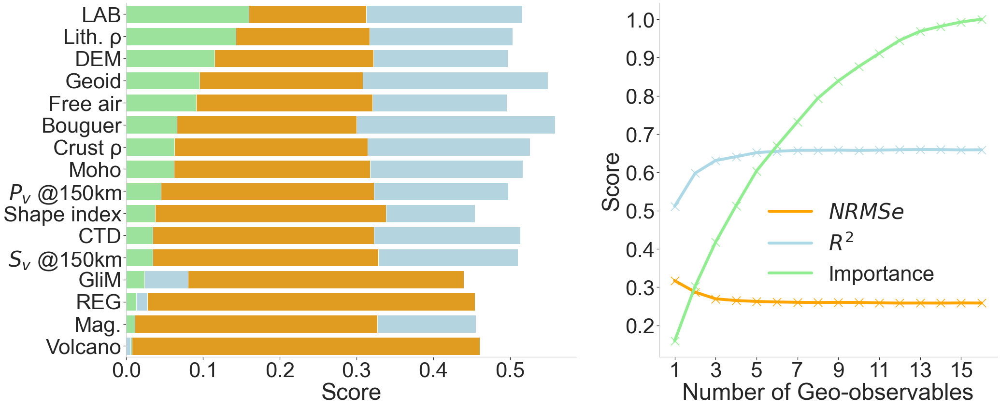

In [34]:
#feature importance 
# Get selected features data set
# should be scaled
fig, ax = plt.subplots(1,2, figsize=(30, 13),gridspec_kw={'width_ratios': [2, 1.5]})

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 2.50

###

sns.barplot(x = feature_importance['$R^2$'].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0], color='lightblue',
            )


sns.barplot(x = feature_importance['NRMSe'].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0], color='orange', label='$NRMSe$',
            )


###

sns.barplot(x = feature_importance['NRMSe RV'].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0], color='orange', 
            )

sns.barplot(x = feature_importance['$R^2$ RV'].values, 
            y = feature_importance['LABELS_gmt'],  
            ax=ax[0], color='lightblue', label='$R^2$',
            )

sns.barplot(x = feature_importance["Relative Importance"].values, 
            y = feature_importance['LABELS_gmt'],  
            ax=ax[0],  color='lightgreen',label=f"""Relative
importance"""
                    )

####

sns.barplot(x = feature_importance['NRMSe Vol'].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0], color='orange',
            )

sns.barplot(x = feature_importance["Relative Importance Vol"].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0],  color='lightgreen',
                    )

sns.barplot(x = feature_importance['$R^2$ Vol'].values, 
            y = feature_importance['LABELS_gmt'], 
            ax=ax[0], color='lightblue',
            )



###
'''
sns.barplot(x = feature_importance["Optimal"].values, 
            y = feature_importance["Optimal"].index, 
            ax=ax[0],  color='lightgreen',
                    )
    
''' 
ax[0].set_ylabel('')
ax[0].grid(False)



#ax[0].patch.set_edgecolor('black')  
#ax[0].patch.set_linewidth('3') 
# Hide the right and top spines
ax[0].spines.right.set_visible(False)
ax[0].spines.top.set_visible(False)

# Only show ticks on the left and bottom spines
ax[0].yaxis.set_ticks_position('left')
ax[0].xaxis.set_ticks_position('bottom')





ax[0].locator_params(axis='x', nbins=7)
#ax[0].legend(loc=[.55, .6], framealpha=0.5)

#ax[0].set_title(f'{sub_figs[0]})', loc ='left', pad=20, size=40,  y=1.1)
ax[0].set_xlabel("Score")


for key, score in scoring.items():
    #selected_features = feature_names[results[key].support_].tolist()
    # Get Performance Data
    #print(f"Optimal number of features for {key} : {results[key].n_features_}")
    if key == '$NRMSe$':
        results[key].support_rfecv_df = pd.DataFrame(results[key].ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
        if results[key].grid_scores_.mean(axis=1).min() < 0:
            ax[1].plot(range(1, len(results[key].grid_scores_) + 1),                  
                       results[key].grid_scores_.mean(axis=1)*-1, color='orange', 
                       linewidth=6,label=key)
            ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                        results[key].grid_scores_.mean(axis=1)*-1, color='orange',
                          s=300, marker='x')

        else:
            ax[1].plot(range(1, len(results[key].grid_scores_) + 1), 
                     results[key].grid_scores_.mean(axis=1), color='orange', linewidth=6,
                       label=key)
            ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                        results[key].grid_scores_.mean(axis=1), color='orange', s=300, 
                          marker='x')
    else:
      
        
        results[key].support_rfecv_df = pd.DataFrame(results[key].ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
        if results[key].grid_scores_.mean(axis=1).min() < 0:
            ax[1].plot(range(1, len(results[key].grid_scores_) + 1),                  
                       results[key].grid_scores_.mean(axis=1)*-1, color='lightblue', linewidth=6,label=key)
            ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                        results[key].grid_scores_.mean(axis=1)*-1, color='lightblue', s=300, marker='x')

        else:
            ax[1].plot(range(1, len(results[key].grid_scores_) + 1), 
                     results[key].grid_scores_.mean(axis=1), color='lightblue', linewidth=6,label=key)
            ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                        results[key].grid_scores_.mean(axis=1), color='lightblue', s=300, marker='x')

ax[1].plot(range(1, len(results[key].grid_scores_) + 1), 
         feature_importance['Relative Importance'].cumsum().values, linewidth=6, label=f'''Importance''', color='lightgreen',)
ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
            feature_importance['Relative Importance'].cumsum().values,  
          color='lightgreen', s=300, marker='x')

ax[1].set_xlabel("Number of Geo-observables")
ax[1].set_xticks([ 1,3,5,7,9,11,13,15])
ax[1].set_ylabel("Score")
ax[1].legend(loc=[.3, .18], frameon=False)
#ax[1].legend(loc=[.01, .7])
#plt.axvline(results[key].n_features_ ,color='r')
#ax[1].set_title(f'{sub_figs[1]})', loc ='left', pad=20, size=40,  y=1.1)
ax[1].locator_params(axis='y', nbins=10)
ax[1].grid(False)

ax[1].spines.right.set_visible(False)
ax[1].spines.top.set_visible(False)

# Only show ticks on the left and bottom spines
ax[1].yaxis.set_ticks_position('left')
ax[1].xaxis.set_ticks_position('bottom')




# Tight layout
plt.tight_layout()


# Save Figure
#fig.savefig(dir_p/'fig'/'presentation'/"fig_p6d.jpeg", bbox_inches='tight', dpi=300 )
fig.savefig(dir_p/'fig'/"fig_8.pdf", bbox_inches='tight', dpi=300 )

Optimal number of features for $NRMSe$ : 12
Optimal number of features for $R^2$ : 13


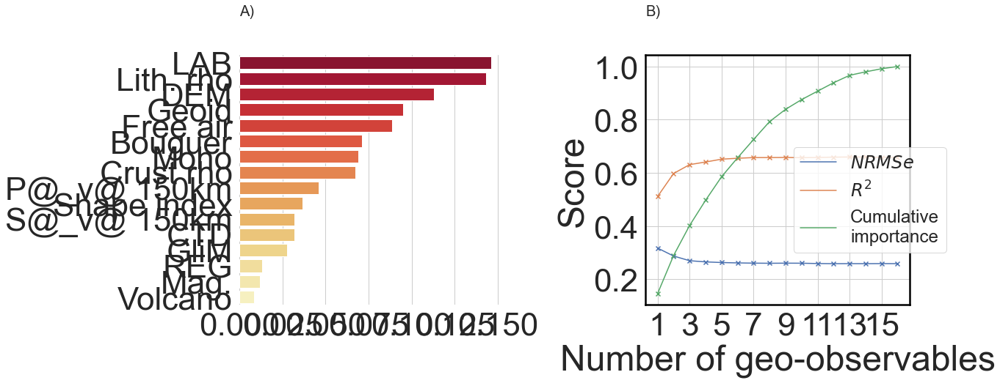

In [35]:
#feature importance 
# Get selected features data set
# should be scaled

sub_figs = list('ABCDEFGHIJKLMNOPQRSTUVWXYZ')

# Set figure size and create barplot
#sns.set(style="whitegrid", color_codes=True, font_scale = 1.8)
fig, ax = plt.subplots(1,2, figsize=(18, 8))

best_features = 16

scoring = {
    '$NRMSe$':nrmse_score,
    #'RMSE':'neg_root_mean_squared_error', 
    #'MAE':'neg_mean_absolute_error', 
    #'MAPE':'neg_mean_absolute_percentage_error', 
    '$R^2$':'r2',
    #'EV':'explained_variance'   
    #'$p_c$': ccc_score,    
}
# Load hyper parameter 
sns.set(style='whitegrid',  font_scale = 2.2)

rfe = RFE(regressor, n_features_to_select = best_features, step = 1, verbose = 1)
selected_features = rfe.fit(X, y).get_feature_names_out()


regressor.fit(X[selected_features],y)

obs.reset_index()
obs_selected = obs.set_index('OBS_REF')

selected_labels = obs_selected.loc[selected_features , 'LABELS'].values


# Get feature importance
feature_importance = pd.DataFrame(selected_labels, columns = ["Observables"])
feature_importance = feature_importance.set_index('Observables')
feature_importance["Relative Importance"] = regressor.feature_importances_

# Sort by feature importance
feature_importance = feature_importance.sort_values(by="Relative Importance", ascending=False)


sns.barplot(x = feature_importance["Relative Importance"].values, 
            y = feature_importance["Relative Importance"].index, ax=ax[0],
            palette = reversed(sns.color_palette('YlOrRd', 16)),  data = feature_importance)


ax[0].set_ylabel('')


# Turn frame off
ax[0].set_frame_on(False)
ax[0].locator_params(axis='x', nbins=7)


ax[0].set_title(f'{sub_figs[0]})', loc ='left', pad=20, size=20,  y=1.1)


for key, score in scoring.items():
    #selected_features = feature_names[results[key].support_].tolist()
    # Get Performance Data
    print(f"Optimal number of features for {key} : {results[key].n_features_}")
    results[key].support_rfecv_df = pd.DataFrame(results[key].ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
    if results[key].grid_scores_.mean(axis=1).min() < 0:
        ax[1].plot(range(1, len(results[key].grid_scores_) + 1),                  results[key].grid_scores_.mean(axis=1)*-1, label=key)
        ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                    results[key].grid_scores_.mean(axis=1)*-1, marker='x')

    else:
        ax[1].plot(range(1, len(results[key].grid_scores_) + 1), 
                 results[key].grid_scores_.mean(axis=1), label=key)
        ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
                    results[key].grid_scores_.mean(axis=1), marker='x')
        
ax[1].plot(range(1, len(results[key].grid_scores_) + 1), 
         feature_importance['Relative Importance'].cumsum().values, label=f'''Cumulative
importance''')
ax[1].scatter(range(1, len(results[key].grid_scores_) + 1), 
            feature_importance['Relative Importance'].cumsum().values, marker='x')

ax[1].set_xlabel("Number of geo-observables")
ax[1].set_xticks([ 1,3,5,7,9,11,13,15])
ax[1].set_ylabel("Score")
ax[1].legend(loc=[.56, .21])
#plt.axvline(results[key].n_features_ ,color='r')
ax[1].set_title(f'{sub_figs[1]})', loc ='left', pad=20, size=20,  y=1.1)



# Tight layout
plt.tight_layout()


# Save Figure
#fig.savefig(dir_p/ 'fig'/"fig_5.jpeg", bbox_inches='tight', dpi=300 )